
# A Notebook to analyze downloaded gridded climate time-series data 

## (Case study:  the Sauk-Suiattle Watershed )
<img src= "http://www.sauk-suiattle.com/images/Elliott.jpg"
style="float:left;width:150px;padding:20px">   
This data is compiled to digitally observe the Sauk-Suiattle Watershed, powered by HydroShare. <br />
<br />
Use this Jupyter Notebook to: <br />
Migrate data sets from prior data download events,
Compute daily, monthly, and annual temperature and precipitation statistics, <br /> 
Visualize precipitation results relative to the forcing data, <br />
Visualize the time-series trends among the gridded cells using different Gridded data products. <br />

<br /> <br /> <br /> <img src="https://www.washington.edu/brand/files/2014/09/W-Logo_Purple_Hex.png" style="float:right;width:120px;padding:20px">  
#### A Watershed Dynamics Model by the Watershed Dynamics Research Group in the Civil and Environmental Engineering Department at the University of Washington 

## 1.  HydroShare Setup and Preparation

To run this notebook, we must import several libaries. These are listed in order of 1) Python standard libraries, 2) hs_utils library provides functions for interacting with HydroShare, including resource querying, dowloading and creation, and 3) the observatory_gridded_hydromet library that is downloaded with this notebook. 

In [ ]:
!conda install -c conda-forge basemap-data-hires --yes

In [ ]:
!conda install ogh --yes

In [1]:
# data processing
import os
import pandas as pd, numpy as np, dask, json
from utilities import hydroshare
import ogh

# # plotting and shape libraries
# import matplotlib as mpl
# import matplotlib.pyplot as plt
%matplotlib inline

# # spatial plotting
# import fiona
# import shapely.ops
# from shapely.geometry import MultiPolygon, shape, point, box, Polygon
# from descartes import PolygonPatch
# from matplotlib.collections import PatchCollection
# from mpl_toolkits.basemap import Basemap
import geopandas as gpd

import warnings
warnings.filterwarnings("ignore")

In [ ]:
!wget https://raw.githubusercontent.com/Freshwater-Initiative/Observatory/master/ogh/ogh_meta.json

In [2]:
# initialize ogh_meta
meta_file = dict(ogh.ogh_meta())
sorted(meta_file.keys())

['dailymet_bclivneh2013',
 'dailymet_livneh2013',
 'dailymet_livneh2015',
 'dailyvic_livneh2013',
 'dailyvic_livneh2015',
 'dailywrf_bcsalathe2014',
 'dailywrf_salathe2014']

In [3]:
sorted(meta_file['dailymet_livneh2013'].keys())

['decision_steps',
 'delimiter',
 'domain',
 'end_date',
 'file_format',
 'filename_structure',
 'reference',
 'spatial_resolution',
 'start_date',
 'subdomain',
 'temporal_resolution',
 'variable_info',
 'variable_list',
 'web_protocol']

In [4]:
!ls -lt
!pwd

total 51860
-rw-r--r-- 1 jovyan users   645588 Apr  3 21:50 SkagitOBSPrecip.png
-rw-r--r-- 1 jovyan users   644036 Apr  3 21:50 SkagitWRFPrecip.png
-rw-r--r-- 1 jovyan users 12143490 Apr  3 21:48 Observatory_usecase_04032018_1246.ipynb
-rw-r--r-- 1 jovyan users   428751 Apr  3 21:02 UpperforksOBSPrecip.png
-rw-r--r-- 1 jovyan users   430226 Apr  3 21:02 UpperforksWRFPrecip.png
-rw-r--r-- 1 jovyan users   669824 Apr  3 21:02 SaukOBSPrecip.png
-rw-r--r-- 1 jovyan users   670104 Apr  3 21:01 SaukWRFPrecip.png
-rw-r--r-- 1 jovyan users 15031196 Apr  3 19:47 Observatory_usecase_04022018_1658.ipynb
-rw-r--r-- 1 jovyan users   417463 Apr  3 18:55 upperforksPrecip2006.png
-rw-r--r-- 1 jovyan users   656986 Apr  3 18:54 SaukPrecip2006.png
-rw-r--r-- 1 jovyan users   646181 Apr  3 18:54 skagitPrecip2006.png
-rw-r--r-- 1 jovyan users   645817 Apr  3 18:49 SaukPrecipJan.png
-rw-r--r-- 1 jovyan users   418162 Apr  3 18:25 SaukPrecipNov.png
-rw-r--r-- 1 jovyan users   420343 Apr  2 23:52 UpperforkLi

Establish a secure connection with HydroShare by instantiating the hydroshare class that is defined within hs_utils. In addition to connecting with HydroShare, this command also sets and prints environment variables for several parameters that will be useful for saving work back to HydroShare. 

In [5]:
notebookdir = os.getcwd()

hs=hydroshare.hydroshare()
homedir = hs.getContentPath(os.environ["HS_RES_ID"])
os.chdir(homedir)
print('Data will be loaded from and save to:'+homedir)

Adding the following system variables:
   HS_USR_NAME = ChristinaBandaragoda
   HS_RES_ID = 4ac20993aa244c08baa9e5965dd6b810
   HS_RES_TYPE = compositeresource
   JUPYTER_HUB_IP = jupyter.cuahsi.org

These can be accessed using the following command: 
   os.environ[key]

   (e.g.)
   os.environ["HS_USR_NAME"]  => ChristinaBandaragoda
Successfully established a connection with HydroShare
Data will be loaded from and save to:/home/jovyan/work/notebooks/data/4ac20993aa244c08baa9e5965dd6b810/4ac20993aa244c08baa9e5965dd6b810/data/contents


If you are curious about where the data is being downloaded, click on the Jupyter Notebook dashboard icon to return to the File System view.  The homedir directory location printed above is where you can find the data and contents you will download to a HydroShare JupyterHub server.  At the end of this work session, you can migrate this data to the HydroShare iRods server as a Generic Resource. 

## 2. Get list of gridded climate points for the watershed

This example uses a shapefile with the watershed boundary of the Sauk-Suiattle Basin, which is stored in HydroShare at the following url: https://www.hydroshare.org/resource/c532e0578e974201a0bc40a37ef2d284/. 

The data for our processing routines can be retrieved using the getResourceFromHydroShare function by passing in the global identifier from the url above.  In the next cell, we download this resource from HydroShare, and identify that the points in this resource are available for downloading gridded hydrometeorology data, based on the point shapefile at https://www.hydroshare.org/resource/ef2d82bf960144b4bfb1bae6242bcc7f/, which is for the extent of North America and includes the average elevation for each 1/16 degree grid cell.  The file must include columns with station numbers, latitude, longitude, and elevation. The header of these columns must be FID, LAT, LONG_, and ELEV or RASTERVALU, respectively. The station numbers will be used for the remainder of the code to uniquely reference data from each climate station, as well as to identify minimum, maximum, and average elevation of all of the climate stations.  The webserice is currently set to a URL for the smallest geographic overlapping extent - e.g. WRF for Columbia River Basin (to use a limit using data from a FTP service, treatgeoself() would need to be edited in observatory_gridded_hydrometeorology utility). 

In [13]:
"""
1/16-degree Gridded cell centroids
"""
# List of available data
hs.getResourceFromHydroShare('ef2d82bf960144b4bfb1bae6242bcc7f')
NAmer = hs.content['NAmer_dem_list.shp']

"""
Skagit
"""
# Watershed extent
hs.getResourceFromHydroShare('b4c129d29e5e4452985c9d8dc0fe01ed')
skagit = hs.content['SkagitRiver_BasinBoundary.shp']

"""
Sauk
"""
# Watershed extent
hs.getResourceFromHydroShare('c532e0578e974201a0bc40a37ef2d284')
sauk = hs.content['wbdhub12_17110006_WGS84_Basin.shp']

"""
Upper Forks (Sauk)
"""
# Watershed extent
hs.getResourceFromHydroShare('e8a1ccb07bb34fa0a9479dac23126a22')
upperforks = hs.content['UpperForksSauk_abWhiteChuck_Basin.shp']

This resource already exists in your userspace.
Would you like to overwrite this data [Y/n]? n


This resource already exists in your userspace.
Would you like to overwrite this data [Y/n]? n


This resource already exists in your userspace.
Would you like to overwrite this data [Y/n]? y
Download Finished                               
Successfully downloaded resource c532e0578e974201a0bc40a37ef2d284


This resource already exists in your userspace.
Would you like to overwrite this data [Y/n]? y
Download Finished                               
Successfully downloaded resource e8a1ccb07bb34fa0a9479dac23126a22


## Map the Gridded Cell Centroids that intersect with the watersheds of interest
### Summarize the file availability from each watershed mapping file

In [38]:
%%time 
# Generate list of stations to download
mappingfile1=ogh.treatgeoself(shapefile=skagit, NAmer=NAmer, buffer_distance=0.00, 
                              mappingfile=os.path.join(os.getcwd(),'Skagit_mappingfile.csv'))
print(mappingfile1)


mappingfile2=ogh.treatgeoself(shapefile=sauk, NAmer=NAmer, buffer_distance=0.06, 
                              mappingfile=os.path.join(os.getcwd(),'Sauk_mappingfile.csv'))
print(mappingfile2)


mappingfile3=ogh.treatgeoself(shapefile=upperforks, NAmer=NAmer, buffer_distance=0.06, 
                              mappingfile=os.path.join(os.getcwd(),'Upperforks_mappingfile.csv'))
print(mappingfile3)

(248, 4)
   FID       LAT      LONG_    ELEV
0    0  49.28125 -120.84375  1727.0
1    1  49.28125 -120.90625  1551.0
2    2  49.28125 -121.03125  1526.0
3    3  49.28125 -121.15625  1594.0
4    4  49.28125 -121.21875  1212.0
/home/jovyan/work/notebooks/data/4ac20993aa244c08baa9e5965dd6b810/4ac20993aa244c08baa9e5965dd6b810/data/contents/Skagit_mappingfile.csv
(99, 4)
   FID       LAT      LONG_    ELEV
0    0  48.53125 -121.59375  1113.0
1    1  48.46875 -121.46875   646.0
2    2  48.46875 -121.53125   321.0
3    3  48.46875 -121.59375   164.0
4    4  48.46875 -121.65625   369.0
/home/jovyan/work/notebooks/data/4ac20993aa244c08baa9e5965dd6b810/4ac20993aa244c08baa9e5965dd6b810/data/contents/Sauk_mappingfile.csv
(34, 4)
   FID       LAT      LONG_    ELEV
0    0  48.21875 -121.40625  1112.0
1    1  48.21875 -121.46875   926.0
2    2  48.15625 -121.21875  1347.0
3    3  48.15625 -121.28125  1148.0
4    4  48.15625 -121.34375  1094.0
/home/jovyan/work/notebooks/data/4ac20993aa244c08baa9e596

## 3.  Compare Hydrometeorology 

This section performs computations and generates plots of the Livneh 2013, Livneh 2016, and WRF 2014 temperature and precipitation data in order to compare them with each other and observations. The generated plots are automatically downloaded and saved as .png files in the "plots" folder of the user's home directory and inline in the notebook.

In [39]:
# Livneh et al., 2013
dr1 = meta_file['dailymet_livneh2013']

# Salathe et al., 2014
dr2 = meta_file['dailywrf_salathe2014']

# define overlapping time window
dr = ogh.overlappingDates(date_set1=tuple([dr1['start_date'], dr1['end_date']]), 
                          date_set2=tuple([dr2['start_date'], dr2['end_date']]))
dr

('1950-01-01', '2010-12-31')

### INPUT: gridded meteorology from Jupyter Hub folders
Data frames for each set of data are stored in a dictionary. The inputs to gridclim_dict() include the folder location and name of the hydrometeorology data, the file start and end, the analysis start and end, and the elevation band to be included in the analsyis (max and min elevation). <br/>  

#### Create a dictionary of climate variables for the long-term mean (ltm) using the default elevation option of calculating a high, mid, and low elevation average.  The dictionary here is initialized with the Livneh et al., 2013 dataset with a dictionary output 'ltm_3bands', which is used as an input to the second time we run gridclim_dict(), to add the Salathe et al., 2014 data to the same dictionary. 

In [16]:
help(ogh.gridclim_dict)

Help on function gridclim_dict in module ogh.ogh:

gridclim_dict(mappingfile, dataset, gridclimname=None, metadata=None, min_elev=None, max_elev=None, file_start_date=None, file_end_date=None, file_time_step=None, file_colnames=None, file_delimiter=None, subset_start_date=None, subset_end_date=None, df_dict=None, colvar='all')
    # pipelined operation for assimilating data, processing it, and standardizing the plotting
    
    mappingfile: (dir) the path directory to the mappingfile
    dataset: (str) the name of the dataset within mappingfile to use
    gridclimname: (str) the suffix for the dataset to be named; if None is provided, default to the dataset name
    metadata: (str) the dictionary that contains the metadata explanations; default is None
    min_elev: (float) the minimum elevation criteria; default is None
    max_elev: (float) the maximum elevation criteria; default is None
    file_start_date: (date) the start date of the files that will be read-in; default is None
  

In [17]:
sorted(meta_file.keys())

['dailymet_bclivneh2013',
 'dailymet_livneh2013',
 'dailymet_livneh2015',
 'dailyvic_livneh2013',
 'dailyvic_livneh2015',
 'dailywrf_bcsalathe2014',
 'dailywrf_salathe2014']

 ## 3. Download climate data 

In [40]:
ogh.getDailyMET_livneh2013(homedir, mappingfile1)
ogh.getDailyWRF_salathe2014(homedir, mappingfile1)
ogh.getDailyMET_livneh2013(homedir, mappingfile2)
ogh.getDailyWRF_salathe2014(homedir, mappingfile2)
ogh.getDailyMET_livneh2013(homedir, mappingfile3)
ogh.getDailyWRF_salathe2014(homedir, mappingfile3)

Meteorology_Livneh_CONUSExt_v.1.2_2013_49.03125_-120.84375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_49.15625_-120.90625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_49.28125_-120.84375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.96875_-121.21875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.84375_-120.96875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_49.03125_-120.90625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_49.15625_-120.96875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.90625_-120.78125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_49.28125_-120.90625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.84375_-121.03125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_49.03125_-120.96875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_49.15625_-121.03125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.90625_-120.84375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_49.28125_-121.03125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.84375_

Meteorology_Livneh_CONUSExt_v.1.2_2013_48.65625_-120.84375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.65625_-121.65625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.59375_-121.34375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.78125_-121.71875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.71875_-121.21875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.65625_-120.90625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.65625_-121.71875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.59375_-121.40625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.78125_-121.78125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.71875_-121.28125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.65625_-120.96875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.65625_-121.78125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.59375_-121.46875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.59375_-121.71875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.71875_

Meteorology_Livneh_CONUSExt_v.1.2_2013_48.09375_-121.34375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.28125_-121.21875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.21875_-121.15625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.09375_-121.40625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.15625_-121.28125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.28125_-121.28125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.21875_-121.21875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.15625_-121.34375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.09375_-121.46875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.28125_-121.34375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.21875_-121.28125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.15625_-121.40625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.03125_-121.15625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.21875_-121.34375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.15625_

downloaded: data_48.21875_-121.21875
downloaded: data_48.40625_-121.09375
downloaded: data_48.28125_-121.40625
downloaded: data_48.15625_-121.03125
downloaded: data_48.46875_-121.15625
downloaded: data_48.40625_-121.59375
downloaded: data_48.40625_-122.09375
downloaded: data_48.46875_-121.65625
downloaded: data_48.34375_-121.40625
downloaded: data_48.46875_-121.40625
downloaded: data_48.21875_-121.03125
downloaded: data_48.46875_-121.90625
downloaded: data_48.15625_-121.53125
downloaded: data_48.21875_-121.28125
downloaded: data_48.34375_-121.15625
downloaded: data_48.34375_-122.21875
downloaded: data_48.28125_-121.21875
downloaded: data_48.40625_-121.15625
downloaded: data_48.15625_-121.09375
downloaded: data_48.15625_-121.34375
downloaded: data_48.46875_-122.15625
downloaded: data_48.21875_-121.53125
downloaded: data_48.46875_-121.21875
downloaded: data_48.40625_-121.40625
downloaded: data_48.28125_-121.46875
downloaded: data_48.46875_-121.71875
downloaded: data_48.40625_-121.78125
d

Meteorology_Livneh_CONUSExt_v.1.2_2013_47.96875_-121.28125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_47.90625_-121.28125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.09375_-121.59375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.03125_-121.15625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.03125_-121.46875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_47.96875_-121.34375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_47.90625_-121.34375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.09375_-121.65625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.03125_-121.21875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_47.96875_-121.09375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_47.96875_-121.40625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_47.90625_-121.40625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.09375_-121.71875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.03125_-121.28125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_47.96875_

downloaded: data_47.90625_-121.34375
downloaded: data_47.90625_-121.40625
downloaded: data_47.90625_-121.21875


'/home/jovyan/work/notebooks/data/4ac20993aa244c08baa9e5965dd6b810/4ac20993aa244c08baa9e5965dd6b810/data/contents/salathe2014/WWA_1950_2010/raw'

In [41]:
%%time
ltm_skagit = ogh.gridclim_dict(mappingfile=mappingfile1,
                               metadata=meta_file,
                               dataset='dailymet_livneh2013',
                               file_start_date=dr1['start_date'], 
                               file_end_date=dr1['end_date'],
                               file_time_step=dr1['temporal_resolution'],
                               subset_start_date=dr[0],
                               subset_end_date=dr[1])

ltm_skagit = ogh.gridclim_dict(mappingfile=mappingfile1,
                               metadata=meta_file,
                               dataset='dailywrf_salathe2014',
                               file_start_date=dr2['start_date'], 
                               file_end_date=dr2['end_date'],
                               file_time_step=dr1['temporal_resolution'],
                               subset_start_date=dr[0],
                               subset_end_date=dr[1],
                               df_dict=ltm_skagit)


   FID       LAT      LONG_    ELEV  \
0    0  49.28125 -120.84375  1727.0   
1    1  49.28125 -120.90625  1551.0   
2    2  49.28125 -121.03125  1526.0   
6    6  49.21875 -120.90625  1604.0   
7    7  49.21875 -120.96875  1317.0   

                                 dailymet_livneh2013  \
0  /home/jovyan/work/notebooks/data/4ac20993aa244...   
1  /home/jovyan/work/notebooks/data/4ac20993aa244...   
2  /home/jovyan/work/notebooks/data/4ac20993aa244...   
6  /home/jovyan/work/notebooks/data/4ac20993aa244...   
7  /home/jovyan/work/notebooks/data/4ac20993aa244...   

                                dailywrf_salathe2014  
0  /home/jovyan/work/notebooks/data/4ac20993aa244...  
1  /home/jovyan/work/notebooks/data/4ac20993aa244...  
2  /home/jovyan/work/notebooks/data/4ac20993aa244...  
6  /home/jovyan/work/notebooks/data/4ac20993aa244...  
7  /home/jovyan/work/notebooks/data/4ac20993aa244...  
Number of gridded data files:241
Minimum elevation: 16.0m
Mean elevation: 1133.240663900415m
Maxim

In [42]:
%%time
ltm_sauk = ogh.gridclim_dict(mappingfile=mappingfile2,
                               metadata=meta_file,
                               dataset='dailymet_livneh2013',
                               file_start_date=dr1['start_date'], 
                               file_end_date=dr1['end_date'],
                               file_time_step=dr1['temporal_resolution'],
                               subset_start_date=dr[0],
                               subset_end_date=dr[1])

ltm_sauk = ogh.gridclim_dict(mappingfile=mappingfile2,
                               metadata=meta_file,
                               dataset='dailywrf_salathe2014',
                               file_start_date=dr2['start_date'], 
                               file_end_date=dr2['end_date'],
                               file_time_step=dr1['temporal_resolution'],
                               subset_start_date=dr[0],
                               subset_end_date=dr[1],
                               df_dict=ltm_sauk)


   FID       LAT      LONG_    ELEV  \
0    0  48.53125 -121.59375  1113.0   
1    1  48.46875 -121.46875   646.0   
2    2  48.46875 -121.53125   321.0   
3    3  48.46875 -121.59375   164.0   
4    4  48.46875 -121.65625   369.0   

                                 dailymet_livneh2013  \
0  /home/jovyan/work/notebooks/data/4ac20993aa244...   
1  /home/jovyan/work/notebooks/data/4ac20993aa244...   
2  /home/jovyan/work/notebooks/data/4ac20993aa244...   
3  /home/jovyan/work/notebooks/data/4ac20993aa244...   
4  /home/jovyan/work/notebooks/data/4ac20993aa244...   

                                dailywrf_salathe2014  
0  /home/jovyan/work/notebooks/data/4ac20993aa244...  
1  /home/jovyan/work/notebooks/data/4ac20993aa244...  
2  /home/jovyan/work/notebooks/data/4ac20993aa244...  
3  /home/jovyan/work/notebooks/data/4ac20993aa244...  
4  /home/jovyan/work/notebooks/data/4ac20993aa244...  
Number of gridded data files:99
Minimum elevation: 164.0m
Mean elevation: 1151.040404040404m
Maxim

In [43]:
%%time
ltm_upperforks = ogh.gridclim_dict(mappingfile=mappingfile3,
                               metadata=meta_file,
                               dataset='dailymet_livneh2013',
                               file_start_date=dr1['start_date'], 
                               file_end_date=dr1['end_date'],
                               file_time_step=dr1['temporal_resolution'],
                               subset_start_date=dr[0],
                               subset_end_date=dr[1])

ltm_upperforks = ogh.gridclim_dict(mappingfile=mappingfile3,
                               metadata=meta_file,
                               dataset='dailywrf_salathe2014',
                               file_start_date=dr2['start_date'], 
                               file_end_date=dr2['end_date'],
                               file_time_step=dr1['temporal_resolution'],
                               subset_start_date=dr[0],
                               subset_end_date=dr[1],
                               df_dict=ltm_upperforks)


   FID       LAT      LONG_    ELEV  \
0    0  48.21875 -121.40625  1112.0   
1    1  48.21875 -121.46875   926.0   
2    2  48.15625 -121.21875  1347.0   
3    3  48.15625 -121.28125  1148.0   
4    4  48.15625 -121.34375  1094.0   

                                 dailymet_livneh2013  \
0  /home/jovyan/work/notebooks/data/4ac20993aa244...   
1  /home/jovyan/work/notebooks/data/4ac20993aa244...   
2  /home/jovyan/work/notebooks/data/4ac20993aa244...   
3  /home/jovyan/work/notebooks/data/4ac20993aa244...   
4  /home/jovyan/work/notebooks/data/4ac20993aa244...   

                                dailywrf_salathe2014  
0  /home/jovyan/work/notebooks/data/4ac20993aa244...  
1  /home/jovyan/work/notebooks/data/4ac20993aa244...  
2  /home/jovyan/work/notebooks/data/4ac20993aa244...  
3  /home/jovyan/work/notebooks/data/4ac20993aa244...  
4  /home/jovyan/work/notebooks/data/4ac20993aa244...  
Number of gridded data files:34
Minimum elevation: 707.0m
Mean elevation: 1187.5588235294117m
Maxi

## Low elevation climate correction

In [22]:
hs.getResourceFromHydroShare('ff886a1e191e47fd9ba13c23922741da')
low_shapefile = hs.content['SkagitLowElevationGrid_lessthan550_15k_poly.shp']

This resource already exists in your userspace.
Would you like to overwrite this data [Y/n]? 
Download Finished                               
Successfully downloaded resource ff886a1e191e47fd9ba13c23922741da


In [23]:
mappingfile_low=ogh.treatgeoself(shapefile=low_shapefile, NAmer=NAmer, buffer_distance=0, 
                              mappingfile=os.path.join(os.getcwd(),'SkagitLLow_mappingfile.csv'))
print(mappingfile_low)

(75, 4)
   FID       LAT      LONG_   ELEV
0    0  48.71875 -121.65625  419.0
1    1  48.71875 -122.15625  330.0
2    2  48.65625 -121.71875  342.0
3    3  48.65625 -122.09375  533.0
4    4  48.65625 -122.15625  465.0
/home/jovyan/work/notebooks/data/4ac20993aa244c08baa9e5965dd6b810/4ac20993aa244c08baa9e5965dd6b810/data/contents/SkagitLLow_mappingfile.csv


In [24]:
ogh.getDailyMET_livneh2013(homedir, mappingfile_low)
ogh.getDailyWRF_salathe2014(homedir, mappingfile_low)

Meteorology_Livneh_CONUSExt_v.1.2_2013_48.59375_-121.71875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.59375_-122.21875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.71875_-121.65625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.65625_-122.15625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.53125_-121.46875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.59375_-121.78125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.59375_-122.28125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.71875_-122.15625 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.65625_-122.21875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.53125_-121.71875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.59375_-122.03125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.59375_-122.34375 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.65625_-122.28125 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.65625_-121.71875 unzipped
Meteorology_Livneh_CONUSExt_v.1.2_2013_48.53125_

downloaded: data_48.21875_-122.15625
downloaded: data_48.21875_-122.21875
downloaded: data_48.21875_-122.28125


'/home/jovyan/work/notebooks/data/4ac20993aa244c08baa9e5965dd6b810/4ac20993aa244c08baa9e5965dd6b810/data/contents/salathe2014/WWA_1950_2010/raw'

In [25]:
%%time
ltm_low = ogh.gridclim_dict(mappingfile=mappingfile_low,
                               metadata=meta_file,
                               dataset='dailymet_livneh2013',
                               file_start_date=dr1['start_date'], 
                               file_end_date=dr1['end_date'],
                               file_time_step=dr1['temporal_resolution'],
                               subset_start_date=dr[0],
                               subset_end_date=dr[1])

ltm_low = ogh.gridclim_dict(mappingfile=mappingfile_low,
                               metadata=meta_file,
                               dataset='dailywrf_salathe2014',
                               file_start_date=dr2['start_date'], 
                               file_end_date=dr2['end_date'],
                               file_time_step=dr1['temporal_resolution'],
                               subset_start_date=dr[0],
                               subset_end_date=dr[1],
                               df_dict=ltm_low)

   FID       LAT      LONG_   ELEV  \
0    0  48.71875 -121.65625  419.0   
1    1  48.71875 -122.15625  330.0   
2    2  48.65625 -121.71875  342.0   
3    3  48.65625 -122.09375  533.0   
4    4  48.65625 -122.15625  465.0   

                                 dailymet_livneh2013  \
0  /home/jovyan/work/notebooks/data/4ac20993aa244...   
1  /home/jovyan/work/notebooks/data/4ac20993aa244...   
2  /home/jovyan/work/notebooks/data/4ac20993aa244...   
3  /home/jovyan/work/notebooks/data/4ac20993aa244...   
4  /home/jovyan/work/notebooks/data/4ac20993aa244...   

                                dailywrf_salathe2014  
0  /home/jovyan/work/notebooks/data/4ac20993aa244...  
1  /home/jovyan/work/notebooks/data/4ac20993aa244...  
2  /home/jovyan/work/notebooks/data/4ac20993aa244...  
3  /home/jovyan/work/notebooks/data/4ac20993aa244...  
4  /home/jovyan/work/notebooks/data/4ac20993aa244...  
Number of gridded data files:72
Minimum elevation: 2.0m
Mean elevation: 241.5m
Maximum elevation: 533.0m

In [26]:
#Salathe - Livneh gives crazy numbers for global correction

BiasCorr_wrfbc = ogh.compute_diffs(df_dict=ltm_low, df_str='lowelev',
                                   gridclimname1='dailywrf_salathe2014',
                                   gridclimname2='dailymet_livneh2013',
                                   prefix2=['month'],
                                   prefix1=meta_file['dailymet_livneh2013']['variable_list'])

BiasCorr_wrfbc_P = ogh.compute_ratios(df_dict=ltm_low, df_str='lowelev',
                                      gridclimname1='dailywrf_salathe2014',
                                      gridclimname2='dailymet_livneh2013',
                                      prefix2=['month'],
                                      prefix1=meta_file['dailymet_livneh2013']['variable_list'])

           
BiasCorr_wrfbc['PRECIP_lowelev'] = BiasCorr_wrfbc_P['PRECIP_lowelev']

print('Precipitation values are a ratio of WRF_m/Liv_m and Temperature values are the difference between WRF_m-Liv_m')
print(BiasCorr_wrfbc['PRECIP_lowelev'])
print(sorted(BiasCorr_wrfbc.keys()))

print(sorted(BiasCorr_wrfbc.keys()))
global_biascorr_PRECIP=ltm_low['meanmonth_PRECIP_dailywrf_salathe2014']/ltm_low['meanmonth_PRECIP_dailymet_livneh2013']
print(ltm_low['meanmonth_PRECIP_dailywrf_salathe2014']/ltm_low['meanmonth_PRECIP_dailymet_livneh2013'])

global_biascorr_TMAX=ltm_low['meanmonth_TMAX_dailywrf_salathe2014']-ltm_low['meanmonth_TMAX_dailymet_livneh2013']
print(global_biascorr_TMAX)                                                    

global_biascorr_TMIN=ltm_low['meanmonth_TMIN_dailywrf_salathe2014']-ltm_low['meanmonth_TMIN_dailymet_livneh2013']
print(global_biascorr_TMIN)



Precipitation values are a ratio of WRF_m/Liv_m and Temperature values are the difference between WRF_m-Liv_m
           0          1          2          3          4          5   \
     48.71875   48.71875   48.65625   48.65625   48.65625   48.65625   
   -121.65625 -122.15625 -121.71875 -122.09375 -122.15625 -122.21875   
1    2.108941   1.600851   1.931786   1.535966   0.874698   1.410050   
2    2.196381   1.694968   2.108550   1.655649   0.869171   1.420254   
3    2.228239   1.744666   1.997772   1.721262   0.976645   1.529000   
4    1.994240   1.860717   2.038373   1.952782   1.045321   1.588284   
5    1.849440   1.779904   1.974226   2.092300   1.487154   1.487306   
6    2.090680   1.853952   2.282174   1.865467   1.250501   1.548787   
7    2.243274   1.460411   2.224198   1.669291   0.993630   1.175459   
8    1.922133   1.346890   1.882175   1.404037   0.920854   1.129572   
9    1.579384   1.308778   1.632820   1.371355   0.770588   1.172951   
10   1.747392   1.362259  

In [27]:
BiasCorr_wrfbc = ogh.compute_diffs(df_dict=ltm_low, df_str='lowelev',
                                   gridclimname1='dailymet_livneh2013',
                                   gridclimname2='dailywrf_salathe2014',
                                   prefix2=['month'],
                                   prefix1=meta_file['dailymet_livneh2013']['variable_list'])

BiasCorr_wrfbc_P = ogh.compute_ratios(df_dict=ltm_low, df_str='lowelev',
                                      gridclimname1='dailymet_livneh2013',
                                      gridclimname2='dailywrf_salathe2014',
                                      prefix2=['month'],
                                      prefix1=meta_file['dailymet_livneh2013']['variable_list'])

           
BiasCorr_wrfbc['PRECIP_lowelev'] = BiasCorr_wrfbc_P['PRECIP_lowelev']
print(BiasCorr_wrfbc['PRECIP_lowelev'])
print('Precipitation values are a ratio of WRF_m/Liv_m and Temperature values are the difference between WRF_m-Liv_m')

           0          1          2          3          4          5   \
     48.71875   48.71875   48.65625   48.65625   48.65625   48.65625   
   -121.65625 -122.15625 -121.71875 -122.09375 -122.15625 -122.21875   
1    0.474172   0.624668   0.517656   0.651056   1.143252   0.709194   
2    0.455294   0.589981   0.474260   0.603993   1.150522   0.704099   
3    0.448785   0.573176   0.500558   0.580969   1.023914   0.654022   
4    0.501444   0.537427   0.490587   0.512090   0.956644   0.629610   
5    0.540704   0.561828   0.506528   0.477943   0.672425   0.672357   
6    0.478313   0.539388   0.438179   0.536059   0.799680   0.645667   
7    0.445777   0.684739   0.449600   0.599057   1.006411   0.850731   
8    0.520255   0.742451   0.531300   0.712232   1.085948   0.885291   
9    0.633158   0.764072   0.612437   0.729206   1.297711   0.852550   
10   0.572281   0.734075   0.555778   0.724165   1.282745   0.796947   
11   0.558811   0.654465   0.593325   0.648389   1.128276   0.75

In [28]:
global_wind=[0,0,0,0,0,0,0,0,0,0,0,0]

for column in BiasCorr_wrfbc['PRECIP_lowelev']:
    BiasCorr_wrfbc['PRECIP_lowelev'].ix[1:12,column]=global_biascorr_PRECIP
    BiasCorr_wrfbc['TMAX_lowelev'].ix[1:12,column]=global_biascorr_TMAX
    BiasCorr_wrfbc['TMIN_lowelev'].ix[1:12,column]=global_biascorr_TMIN
    BiasCorr_wrfbc['WINDSPD_lowelev'].ix[1:12,column]=global_wind
print(BiasCorr_wrfbc['PRECIP_lowelev'])
print(BiasCorr_wrfbc['TMAX_lowelev'])
print(BiasCorr_wrfbc['TMIN_lowelev'])
print(BiasCorr_wrfbc['WINDSPD_lowelev'])  

           0          1          2          3          4          5   \
     48.71875   48.71875   48.65625   48.65625   48.65625   48.65625   
   -121.65625 -122.15625 -121.71875 -122.09375 -122.15625 -122.21875   
1    1.401989   1.401989   1.401989   1.401989   1.401989   1.401989   
2    1.461774   1.461774   1.461774   1.461774   1.461774   1.461774   
3    1.495367   1.495367   1.495367   1.495367   1.495367   1.495367   
4    1.616298   1.616298   1.616298   1.616298   1.616298   1.616298   
5    1.606166   1.606166   1.606166   1.606166   1.606166   1.606166   
6    1.695232   1.695232   1.695232   1.695232   1.695232   1.695232   
7    1.551091   1.551091   1.551091   1.551091   1.551091   1.551091   
8    1.344874   1.344874   1.344874   1.344874   1.344874   1.344874   
9    1.272765   1.272765   1.272765   1.272765   1.272765   1.272765   
10   1.346831   1.346831   1.346831   1.346831   1.346831   1.346831   
11   1.320700   1.320700   1.320700   1.320700   1.320700   1.32

In [108]:
#Generate dataframe of correction factors for each i,j grid cell
BiasCorr_wrfbc_skagit = ogh.compute_diffs(df_dict=ltm_skagit, df_str='skagit',
                                   gridclimname1='dailywrf_salathe2014',
                                   gridclimname2='dailymet_livneh2013',
                                   prefix2=['month'],
                                   prefix1=meta_file['dailymet_livneh2013']['variable_list'])

BiasCorr_wrfbc_skagit_P = ogh.compute_ratios(df_dict=ltm_skagit, df_str='skagit',
                                      gridclimname1='dailywrf_salathe2014',
                                      gridclimname2='dailymet_livneh2013',
                                      prefix2=['month'],
                                      prefix1=meta_file['dailymet_livneh2013']['variable_list'])

           
BiasCorr_wrfbc_skagit['PRECIP_skagit'] = BiasCorr_wrfbc_skagit_P['PRECIP_skagit']
print(ltm_skagit['month_TMAX_dailywrf_salathe2014'][0])
print(ltm_skagit['month_TMAX_dailymet_livneh2013'][0])
print(BiasCorr_wrfbc_skagit['TMAX_skagit'][0])
print('Precipitation values are a ratio of WRF_m/Liv_m and Temperature values are the difference between WRF_m-Liv_m')
ogh.saveDictOfDf('BiasCorr_wrfbc_skagit.json', dictionaryObject=BiasCorr_wrfbc_skagit)

#Calculate low elevation correction
print(ltm_low['meanmonth_PRECIP_dailywrf_salathe2014'])
print(ltm_low['meanmonth_PRECIP_dailymet_livneh2013'])

global_biascorr_PRECIP=ltm_low['meanmonth_PRECIP_dailymet_livneh2013']/ltm_low['meanmonth_PRECIP_dailywrf_salathe2014']
print(ltm_low['meanmonth_PRECIP_dailymet_livneh2013']/ltm_low['meanmonth_PRECIP_dailywrf_salathe2014'])

global_biascorr_TMAX=ltm_low['meanmonth_TMAX_dailymet_livneh2013']-ltm_low['meanmonth_TMAX_dailywrf_salathe2014']
print(global_biascorr_TMAX)

global_biascorr_TMIN=ltm_low['meanmonth_TMIN_dailymet_livneh2013']-ltm_low['meanmonth_TMIN_dailywrf_salathe2014']
print(global_biascorr_TMIN)

global_wind=[0,0,0,0,0,0,0,0,0,0,0,0]

#Apply the monthly low elevation correction to every grid cell uniformly

Global_BiasCorr_wrfbc_skagit=BiasCorr_wrfbc_skagit #Set the same size as input, values overwritten below
for column in BiasCorr_wrfbc_skagit['PRECIP_skagit']:
    Global_BiasCorr_wrfbc_skagit['PRECIP_skagit'].ix[1:12,column]=global_biascorr_PRECIP
    Global_BiasCorr_wrfbc_skagit['TMAX_skagit'].ix[1:12,column]=global_biascorr_TMAX
    Global_BiasCorr_wrfbc_skagit['TMIN_skagit'].ix[1:12,column]=global_biascorr_TMIN
    Global_BiasCorr_wrfbc_skagit['WINDSPD_skagit'].ix[1:12,column]=global_wind
#print(BiasCorr_wrfbc_skagit['PRECIP_skagit'])
#print(BiasCorr_wrfbc_skagit['TMAX_skagit'])
#print(BiasCorr_wrfbc_skagit['TMIN_skagit'])
#print(BiasCorr_wrfbc_skagit['WINDSPD_skagit'])  
ogh.saveDictOfDf(outfilename='Global_BiasCorr_wrfbc_skagit.json', dictionaryObject=Global_BiasCorr_wrfbc_skagit)




     49.28125
   -120.84375
1   -5.206177
2   -4.517533
3   -3.880518
4   -1.247749
5    1.648139
6    5.948426
7   12.926325
8   13.553712
9   10.436464
10   4.363199
11  -1.874033
12  -4.347377
     49.28125
   -120.84375
1   -8.257599
2   -4.091021
3    0.293681
4    5.518060
5   10.155013
6   13.382727
7   17.362290
8   16.948636
9   12.555049
10   5.079513
11  -3.183787
12  -7.583554
     49.28125
   -120.84375
1    3.051423
2   -0.426512
3   -4.174199
4   -6.765809
5   -8.506875
6   -7.434301
7   -4.435965
8   -3.394923
9   -2.118585
10  -0.716314
11   1.309754
12   3.236177
Precipitation values are a ratio of WRF_m/Liv_m and Temperature values are the difference between WRF_m-Liv_m


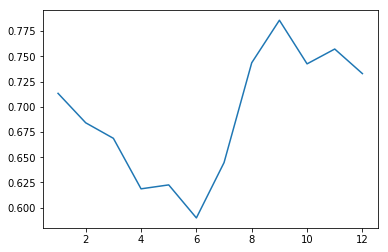

In [95]:
#pandas series plot
# Decrease (fractional) to WRF precipitation using Livneh at low elevations

global_biascorr_PRECIP.plot()

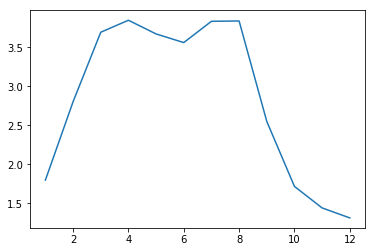

In [96]:
#pandas series plot
#Increase to WRF TMAX

global_biascorr_TMAX.plot()


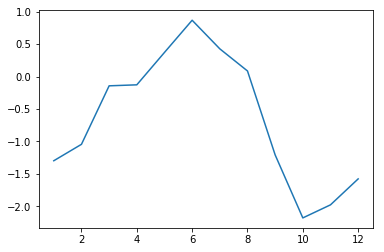

In [97]:
#pandas series plot
#oVERALL decrease to WRF TMIN

global_biascorr_TMIN.plot()


In [76]:
!ls

biascorr_WRF_liv			    SaukWRFPrecip.png
livneh2013				    SaukWRFTMAX.png
Observatory_Sauk_LivBC2WRFlow_092317.ipynb  SkagitLivTmaxNov.png
Observatory_Skagit_BC2low_122217.ipynb	    SkagitLLow_mappingfile.csv
Observatory_usecase_04022018_1658.ipynb     Skagit_mappingfile.csv
Observatory_usecase_04032018_1246.ipynb     SkagitOBSPrecip.png
Observatory_usecase1.ipynb		    SkagitOBSTMAX.png
Observatory_usecase2.ipynb		    skagitPrecip2006.png
Observatory_usecase_Jim.ipynb		    SkagitWRFPrecip.png
ogh_meta.json				    SkagitWRFTMAX.png
salathe2014				    UpperforkLivTmaxNov.png
SaukLivTmaxNov.png			    Upperforks_mappingfile.csv
Sauk_mappingfile.csv			    UpperforksOBSPrecip.png
SaukOBSPrecip.png			    UpperforksOBSTMAX.png
SaukOBSTMAX.png				    upperforksPrecip2006.png
SaukPrecip2006.png			    UpperforksWRFPrecip.png
SaukPrecipJan.png			    UpperforksWRFTMAX.png
SaukPrecipNov.png


## Bias correct Livneh to WRF monthly mean at each grid cell.
#### Input: Correction matrix for each grid cell, Livneh Time Series
#### Output: Corrected Livneh data (livneh2013_wrfbc)

In [81]:
Daily_MET_1915_2011_WRFbc, meta_file = ogh.makebelieve(homedir=homedir,
                                                           mappingfile=mappingfile1,
                                                           BiasCorr=BiasCorr_wrfbc_skagit,
                                                           metadata=meta_file,
                                                           start_catalog_label='dailymet_livneh2013',
                                                           end_catalog_label='dailymet_livneh2013_wrfbc', 
                                                           file_start_date=None,
                                                           file_end_date=None,
                                                           data_dir=None,
                                                           dest_dir_suffix='biascorrWRF_liv')

destdir created
   FID       LAT      LONG_    ELEV  \
0    0  49.28125 -120.84375  1727.0   
1    1  49.28125 -120.90625  1551.0   
2    2  49.28125 -121.03125  1526.0   
6    6  49.21875 -120.90625  1604.0   
7    7  49.21875 -120.96875  1317.0   

                                 dailymet_livneh2013  \
0  /home/jovyan/work/notebooks/data/4ac20993aa244...   
1  /home/jovyan/work/notebooks/data/4ac20993aa244...   
2  /home/jovyan/work/notebooks/data/4ac20993aa244...   
6  /home/jovyan/work/notebooks/data/4ac20993aa244...   
7  /home/jovyan/work/notebooks/data/4ac20993aa244...   

                                dailywrf_salathe2014  
0  /home/jovyan/work/notebooks/data/4ac20993aa244...  
1  /home/jovyan/work/notebooks/data/4ac20993aa244...  
2  /home/jovyan/work/notebooks/data/4ac20993aa244...  
6  /home/jovyan/work/notebooks/data/4ac20993aa244...  
7  /home/jovyan/work/notebooks/data/4ac20993aa244...  
Number of gridded data files:241
Minimum elevation: 16.0m
Mean elevation: 1133.240

172 station: (179.0, 48.40625, -121.21875)
173 station: (180.0, 48.40625, -121.28125)
174 station: (181.0, 48.40625, -121.34375)
175 station: (182.0, 48.40625, -121.40625)
176 station: (183.0, 48.40625, -121.46875)
177 station: (184.0, 48.40625, -121.53125)
178 station: (185.0, 48.40625, -121.59375)
179 station: (186.0, 48.40625, -121.78125)
180 station: (187.0, 48.40625, -121.96875)
181 station: (188.0, 48.40625, -122.03125)
182 station: (189.0, 48.40625, -122.09375)
183 station: (190.0, 48.40625, -122.15625)
184 station: (191.0, 48.40625, -122.21875)
185 station: (192.0, 48.34375, -121.09375)
186 station: (193.0, 48.34375, -121.15625)
187 station: (194.0, 48.34375, -121.21875)
188 station: (195.0, 48.34375, -121.28125)
189 station: (196.0, 48.34375, -121.34375)
190 station: (197.0, 48.34375, -121.40625)
191 station: (198.0, 48.34375, -121.46875)
192 station: (199.0, 48.34375, -121.53125)
193 station: (200.0, 48.34375, -122.15625)
194 station: (201.0, 48.34375, -122.21875)
195 station

## Bias correct LivnehWRFbc to low elevation bias correction 
#### Input: Correction array of 12 values, one per month for low elevation WRF bias, Livneh Time Series corrected to WRF
#### Output: Corrected Livneh data (livneh2013_wrfbc_global)

In [82]:
Daily_MET_1915_2011_WRFbc_global, meta_file = ogh.makebelieve(homedir=homedir,
                                                           mappingfile=mappingfile1,
                                                           BiasCorr=Global_BiasCorr_wrfbc_skagit,
                                                           metadata=meta_file,
                                                           start_catalog_label='dailymet_livneh2013_wrfbc',
                                                           end_catalog_label='dailymet_livneh2013_wrfbc_global', 
                                                           file_start_date=None,
                                                           file_end_date=None,
                                                           data_dir=None,
                                                           dest_dir_suffix='biascorr_WRF_liv_global')

destdir created
   FID       LAT      LONG_    ELEV  \
0    0  49.28125 -120.84375  1727.0   
1    1  49.28125 -120.90625  1551.0   
2    2  49.28125 -121.03125  1526.0   
3    6  49.21875 -120.90625  1604.0   
4    7  49.21875 -120.96875  1317.0   

                                 dailymet_livneh2013  \
0  /home/jovyan/work/notebooks/data/4ac20993aa244...   
1  /home/jovyan/work/notebooks/data/4ac20993aa244...   
2  /home/jovyan/work/notebooks/data/4ac20993aa244...   
3  /home/jovyan/work/notebooks/data/4ac20993aa244...   
4  /home/jovyan/work/notebooks/data/4ac20993aa244...   

                                dailywrf_salathe2014  \
0  /home/jovyan/work/notebooks/data/4ac20993aa244...   
1  /home/jovyan/work/notebooks/data/4ac20993aa244...   
2  /home/jovyan/work/notebooks/data/4ac20993aa244...   
3  /home/jovyan/work/notebooks/data/4ac20993aa244...   
4  /home/jovyan/work/notebooks/data/4ac20993aa244...   

                           dailymet_livneh2013_wrfbc  
0  /home/jovyan/work

164 station: (171.0, 48.46875, -121.96875)
165 station: (172.0, 48.46875, -122.03125)
166 station: (173.0, 48.46875, -122.09375)
167 station: (174.0, 48.46875, -122.15625)
168 station: (175.0, 48.46875, -122.21875)
169 station: (176.0, 48.46875, -122.28125)
170 station: (177.0, 48.40625, -121.09375)
171 station: (178.0, 48.40625, -121.15625)
172 station: (179.0, 48.40625, -121.21875)
173 station: (180.0, 48.40625, -121.28125)
174 station: (181.0, 48.40625, -121.34375)
175 station: (182.0, 48.40625, -121.40625)
176 station: (183.0, 48.40625, -121.46875)
177 station: (184.0, 48.40625, -121.53125)
178 station: (185.0, 48.40625, -121.59375)
179 station: (186.0, 48.40625, -121.78125)
180 station: (187.0, 48.40625, -121.96875)
181 station: (188.0, 48.40625, -122.03125)
182 station: (189.0, 48.40625, -122.09375)
183 station: (190.0, 48.40625, -122.15625)
184 station: (191.0, 48.40625, -122.21875)
185 station: (192.0, 48.34375, -121.09375)
186 station: (193.0, 48.34375, -121.15625)
187 station

In [92]:
ltm_skagit = ogh.gridclim_dict(mappingfile=mappingfile1,
                               metadata=meta_file,
                               dataset='dailymet_livneh2013_wrfbc',
                               file_start_date=dr1['start_date'], 
                               file_end_date=dr1['end_date'],
                               file_time_step=dr1['temporal_resolution'],
                               subset_start_date=dr[0],
                               subset_end_date=dr[1],
                               df_dict=ltm_skagit)

   FID       LAT      LONG_    ELEV  \
0    0  49.28125 -120.84375  1727.0   
1    1  49.28125 -120.90625  1551.0   
2    2  49.28125 -121.03125  1526.0   
3    6  49.21875 -120.90625  1604.0   
4    7  49.21875 -120.96875  1317.0   

                                 dailymet_livneh2013  \
0  /home/jovyan/work/notebooks/data/4ac20993aa244...   
1  /home/jovyan/work/notebooks/data/4ac20993aa244...   
2  /home/jovyan/work/notebooks/data/4ac20993aa244...   
3  /home/jovyan/work/notebooks/data/4ac20993aa244...   
4  /home/jovyan/work/notebooks/data/4ac20993aa244...   

                                dailywrf_salathe2014  \
0  /home/jovyan/work/notebooks/data/4ac20993aa244...   
1  /home/jovyan/work/notebooks/data/4ac20993aa244...   
2  /home/jovyan/work/notebooks/data/4ac20993aa244...   
3  /home/jovyan/work/notebooks/data/4ac20993aa244...   
4  /home/jovyan/work/notebooks/data/4ac20993aa244...   

                           dailymet_livneh2013_wrfbc  \
0  /home/jovyan/work/notebooks/data

AttributeError: 'Int64Index' object has no attribute 'month'

In [90]:
ltm_skagit = ogh.gridclim_dict(mappingfile=mappingfile1,
                               metadata=meta_file,
                               dataset='dailymet_livneh2013_wrfbc_global',
                               file_start_date=dr1['start_date'], 
                               file_end_date=dr1['end_date'],
                               file_time_step=dr1['temporal_resolution'],
                               subset_start_date=dr[0],
                               subset_end_date=dr[1],
                               df_dict=ltm_skagit)

   FID       LAT      LONG_    ELEV  \
0    0  49.28125 -120.84375  1727.0   
1    1  49.28125 -120.90625  1551.0   
2    2  49.28125 -121.03125  1526.0   
3    6  49.21875 -120.90625  1604.0   
4    7  49.21875 -120.96875  1317.0   

                                 dailymet_livneh2013  \
0  /home/jovyan/work/notebooks/data/4ac20993aa244...   
1  /home/jovyan/work/notebooks/data/4ac20993aa244...   
2  /home/jovyan/work/notebooks/data/4ac20993aa244...   
3  /home/jovyan/work/notebooks/data/4ac20993aa244...   
4  /home/jovyan/work/notebooks/data/4ac20993aa244...   

                                dailywrf_salathe2014  \
0  /home/jovyan/work/notebooks/data/4ac20993aa244...   
1  /home/jovyan/work/notebooks/data/4ac20993aa244...   
2  /home/jovyan/work/notebooks/data/4ac20993aa244...   
3  /home/jovyan/work/notebooks/data/4ac20993aa244...   
4  /home/jovyan/work/notebooks/data/4ac20993aa244...   

                           dailymet_livneh2013_wrfbc  \
0  /home/jovyan/work/notebooks/data

In [91]:
sorted(ltm_skagit.keys())

['PRECIP_dailymet_livneh2013',
 'PRECIP_dailymet_livneh2013_wrfbc',
 'PRECIP_dailymet_livneh2013_wrfbc_global',
 'PRECIP_dailywrf_salathe2014',
 'TMAX_dailymet_livneh2013',
 'TMAX_dailymet_livneh2013_wrfbc',
 'TMAX_dailymet_livneh2013_wrfbc_global',
 'TMAX_dailywrf_salathe2014',
 'TMIN_dailymet_livneh2013',
 'TMIN_dailymet_livneh2013_wrfbc',
 'TMIN_dailymet_livneh2013_wrfbc_global',
 'TMIN_dailywrf_salathe2014',
 'WINDSPD_dailymet_livneh2013',
 'WINDSPD_dailymet_livneh2013_wrfbc',
 'WINDSPD_dailymet_livneh2013_wrfbc_global',
 'WINDSPD_dailywrf_salathe2014',
 'anom_year_PRECIP_dailymet_livneh2013',
 'anom_year_PRECIP_dailymet_livneh2013_wrfbc',
 'anom_year_PRECIP_dailymet_livneh2013_wrfbc_global',
 'anom_year_PRECIP_dailywrf_salathe2014',
 'anom_year_TMAX_dailymet_livneh2013',
 'anom_year_TMAX_dailymet_livneh2013_wrfbc',
 'anom_year_TMAX_dailymet_livneh2013_wrfbc_global',
 'anom_year_TMAX_dailywrf_salathe2014',
 'anom_year_TMIN_dailymet_livneh2013',
 'anom_year_TMIN_dailymet_livneh2013_

In [47]:
# graphical control libraries
import matplotlib as mpl
# mpl.use('agg')
import matplotlib.pyplot as plt


# shape and layer libraries
import fiona
import shapely.ops
from shapely.geometry import MultiPolygon, shape, point, box
from descartes import PolygonPatch
from matplotlib.collections import PatchCollection
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import geopandas as gpd

def renderValuesInPoints(vardf, vardf_dateindex, shapefile, outfilepath, plottitle, colorbar_label,
                         spatial_resolution=1/16, margin=0.5, epsg=3857,
                         basemap_image='Canvas/World_Dark_Gray_Base', cmap='coolwarm'):
    """
    A function to render the dynamics across gridded cell centroids on the spatial landscape
    
    vardf: (dataframe) a time-series dataframe for a variable with time-points (rows) and gridded cell centroids (column)
    vardf_dateindex: (datetime or float) a datetime identifier to extract a row of data for visualization
    shapefile: (dir) the path to a shapefile
    outfilepath: (dir) the path for the output image file
    plottitle: (str) the title of the plot
    colorbar_label: (str) the label for the colorbar
    spatial_resolution: (float) the degree of longitude-latitude separation between gridded cell centroids, e.g., 1/16
    margin: (float) the fraction of width and height to view outside of the watershed shapefile
    epsg: (int) the epsg code for regional projection, e.g. 3857
    basemap_image: (str) the basemap arcgis service e.g., 'Canvas/World_Dark_Gray_Base' or 'ESRI_Imagery_World_2D'
    cmap: (str) the code for matplotlib colormaps, e.g. 'coolwarm',
    """
    
    # generate the figure axis
    fig = plt.figure(figsize=(2,2), dpi=500)
    ax1 = plt.subplot2grid((1,1),(0,0))

    # generate the polygon color-scheme
    cmap = mpl.cm.get_cmap(cmap)
    norm = mpl.colors.Normalize(vardf.values.flatten().min(), vardf.values.flatten().max())
    color_producer = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

    # calculate bounding box based on the watershed shapefile
    watershed = fiona.open(shapefile)
    minx, miny, maxx, maxy = watershed.bounds
    w, h = maxx - minx, maxy - miny
    watershed.close()
    
    # generate basemap
    m = Basemap(projection='merc', epsg=epsg, resolution='h', ax=ax1,
                llcrnrlon=minx-margin*w, llcrnrlat=miny-margin*h, urcrnrlon=maxx+margin*w, urcrnrlat=maxy+margin*h)
    m.arcgisimage(service=basemap_image, xpixels=500)
                         
    # watershed
    m.readshapefile(shapefile=shapefile.replace('.shp',''), name='watershed', drawbounds=True, color='k')
    
    # variable dataframe
    midpt=spatial_resolution/2
    crs={'init':'epsg:{0}'.format(epsg)}
    cat=vardf.T.reset_index(level=[1,2]).rename(columns={'level_1':'LAT','level_2':'LONG_'})
    geometry = cat.apply(lambda x: 
                         shapely.ops.transform(m, box(x['LONG_']-midpt, x['LAT']-midpt, 
                                                      x['LONG_']+midpt, x['LAT']+midpt)), axis=1)
    cat = gpd.GeoDataFrame(cat, crs=crs, geometry=geometry).reset_index(drop=True)

    # geopandas print
    cat.plot(column=vardf_dateindex, cmap=cmap, alpha=0.4, ax=ax1,
             vmin=vardf.values.flatten().min(), vmax=vardf.values.flatten().max())

    # assimilate the shapes to plot
    patches = []
    for ind, eachpol in cat.iterrows():
        patches.append(PolygonPatch(eachpol['geometry'], linewidth=0, zorder=5.0,
                                    fc=color_producer.to_rgba(eachpol[vardf_dateindex])))

    # assimilate shapes into a patch collection
    coll = PatchCollection(patches, cmap=cmap, match_original=True, zorder=10.0)
    
    # generate colorbar
    coll.set_array(vardf.values.flatten())
    coll.set_clim([vardf.as_matrix().min(), vardf.as_matrix().max()])
    cbar = plt.colorbar(coll, shrink=0.5)
    cbar.ax.set_ylabel(colorbar_label, rotation=270, size=3, labelpad=5) # colorbar label
    cbar.ax.tick_params(labelsize=3) # colorbar tick fontsize

    # save image
    plt.title(plottitle, fontsize=3)
    plt.savefig(outfilepath)
    plt.show()

In [48]:
# graphical control libraries
import matplotlib as mpl
# mpl.use('agg')
import matplotlib.pyplot as plt


# shape and layer libraries
import fiona
import shapely.ops
from shapely.geometry import MultiPolygon, shape, point, box
from descartes import PolygonPatch
from matplotlib.collections import PatchCollection
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import geopandas as gpd

def renderValuesInPoints_scale(vardf, vardf_dateindex, vardfmin, vardfmax, shapefile, outfilepath, plottitle, 
                               colorbar_label, spatial_resolution=1/16, margin=0.5, epsg=3857,
                               basemap_image='Canvas/World_Dark_Gray_Base', cmap='coolwarm'):
    """
    A function to render the dynamics across gridded cell centroids on the spatial landscape
    
    vardf: (dataframe) a time-series dataframe for a variable with time-points (rows) and gridded cell centroids (column)
    vardf_dateindex: (datetime or float) a datetime identifier to extract a row of data for visualization
    vardfmin: (int) the minimum value for the colormap scale
    vardfmax: (int) the maximum value for the colormap scale
    shapefile: (dir) the path to a shapefile
    outfilepath: (dir) the path for the output image file
    plottitle: (str) the title of the plot
    colorbar_label: (str) the label for the colorbar
    spatial_resolution: (float) the degree of longitude-latitude separation between gridded cell centroids, e.g., 1/16
    margin: (float) the fraction of width and height to view outside of the watershed shapefile
    epsg: (int) the epsg code for regional projection, e.g. 3857
    basemap_image: (str) the basemap arcgis service e.g., 'Canvas/World_Dark_Gray_Base' or 'ESRI_Imagery_World_2D'
    cmap: (str) the code for matplotlib colormaps, e.g. 'coolwarm',
    """
    
    # generate the figure axis
    fig = plt.figure(figsize=(2,2), dpi=500)
    ax1 = plt.subplot2grid((1,1),(0,0))

    # generate the polygon color-scheme
    cmap = mpl.cm.get_cmap(cmap)
    norm = mpl.colors.Normalize(vardfmin, vardfmax)
    color_producer = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

    # calculate bounding box based on the watershed shapefile
    watershed = fiona.open(shapefile)
    minx, miny, maxx, maxy = watershed.bounds
    w, h = maxx - minx, maxy - miny
    watershed.close()
    
    # generate basemap
    m = Basemap(projection='merc', epsg=epsg, resolution='h', ax=ax1,
                llcrnrlon=minx-margin*w, llcrnrlat=miny-margin*h, urcrnrlon=maxx+margin*w, urcrnrlat=maxy+margin*h)
    m.arcgisimage(service=basemap_image, xpixels=500)
                         
    # watershed
    m.readshapefile(shapefile=shapefile.replace('.shp',''), name='watershed', drawbounds=True, color='k')
    
    # variable dataframe
    midpt=spatial_resolution/2
    crs={'init':'epsg:{0}'.format(epsg)}
    cat=vardf.T.reset_index(level=[1,2]).rename(columns={'level_1':'LAT','level_2':'LONG_'})
    geometry = cat.apply(lambda x: 
                         shapely.ops.transform(m, box(x['LONG_']-midpt, x['LAT']-midpt, 
                                                      x['LONG_']+midpt, x['LAT']+midpt)), axis=1)
    cat = gpd.GeoDataFrame(cat, crs=crs, geometry=geometry).reset_index(drop=True)

    # geopandas print
    cat.plot(column=vardf_dateindex, cmap=cmap, alpha=0.4, ax=ax1,
             vmin=vardfmin, vmax=vardfmax)

    # assimilate the shapes to plot
    patches = []
    for ind, eachpol in cat.iterrows():
        patches.append(PolygonPatch(eachpol['geometry'], linewidth=0, zorder=5.0,
                                    fc=color_producer.to_rgba(eachpol[vardf_dateindex])))

    # assimilate shapes into a patch collection
    coll = PatchCollection(patches, cmap=cmap, match_original=True, zorder=10.0)
    
    # generate colorbar
    coll.set_array(vardf.values.flatten())
    coll.set_clim([vardfmin, vardfmax])
    cbar = plt.colorbar(coll, shrink=0.5)
    cbar.ax.set_ylabel(colorbar_label, rotation=270, size=3, labelpad=5) # colorbar label
    cbar.ax.tick_params(labelsize=3) # colorbar tick fontsize

    # save image
    plt.title(plottitle, fontsize=3)
    plt.savefig(outfilepath)
    plt.show()

In [49]:
# loop through each month to compute the 10% Exceedance Probability
# for eachmonth in range(1,13):
#     monthlabel = pd.datetime.strptime(str(eachmonth), '%m')

#     renderValuesInPoints(vardf=ltm_sauk['EXCEED10_dailyvic_livneh2013'],
#                          vardf_dateindex=eachmonth, 
#                          shapefile=sauk.replace('.shp','_2.shp'),
#                          outfilepath='sauk{0}exceed10.png'.format(monthlabel.strftime('%b')),
#                          plottitle='Sauk {0} 10% Exceedance Probability'.format(monthlabel.strftime('%B')),
#                          colorbar_label='cubic feet per second',
#                          cmap='seismic_r')

## 4. Visualize monthly precipitation spatially using Livneh et al., 2013 Meteorology data

### Apply different plotting options:

time-index option <br />
Basemap option <br />
colormap option <br />
projection option <br />

In [50]:
meta_file['dailymet_livneh2013']

{'decision_steps': 'files organized by spatial bounding boxes',
 'delimiter': '\t',
 'domain': 'livnehpublicstorage.colorado.edu',
 'end_date': '2011-12-31',
 'file_format': 'bz2-compressed ASCII',
 'filename_structure': 'Meteorology_Livneh_CONUSExt_v.1.2_2013_{LAT}_{LONG}',
 'reference': {'1': 'Livneh, B., E. A. Rosenberg, C. Lin, B. Nijssen, V. Mishra, K. M. Andreadis, E. P. Maurer, and D. P. Lettenmaier, 2013: A Long-Term Hydrologically Based Dataset of Land Surface Fluxes and States for the Conterminous United States: Update and Extensions. J. Climate, 26, 9384-9392.',
  '2': 'ftp://livnehpublicstorage.colorado.edu/public/Livneh.2013.CONUS.Dataset/readme.txt'},
 'spatial_resolution': '1/16-degree',
 'start_date': '1915-01-01',
 'subdomain': '/public/Livneh.2013.CONUS.Dataset/Meteorology.asc.v.1.2.1915.2011.bz2/',
 'temporal_resolution': 'D',
 'variable_info': {'PRECIP': {'desc': 'daily precipitation (mm)',
   'dtypes': 'float64',
   'units': 'mm'},
  'TMAX': {'desc': 'daily maximum

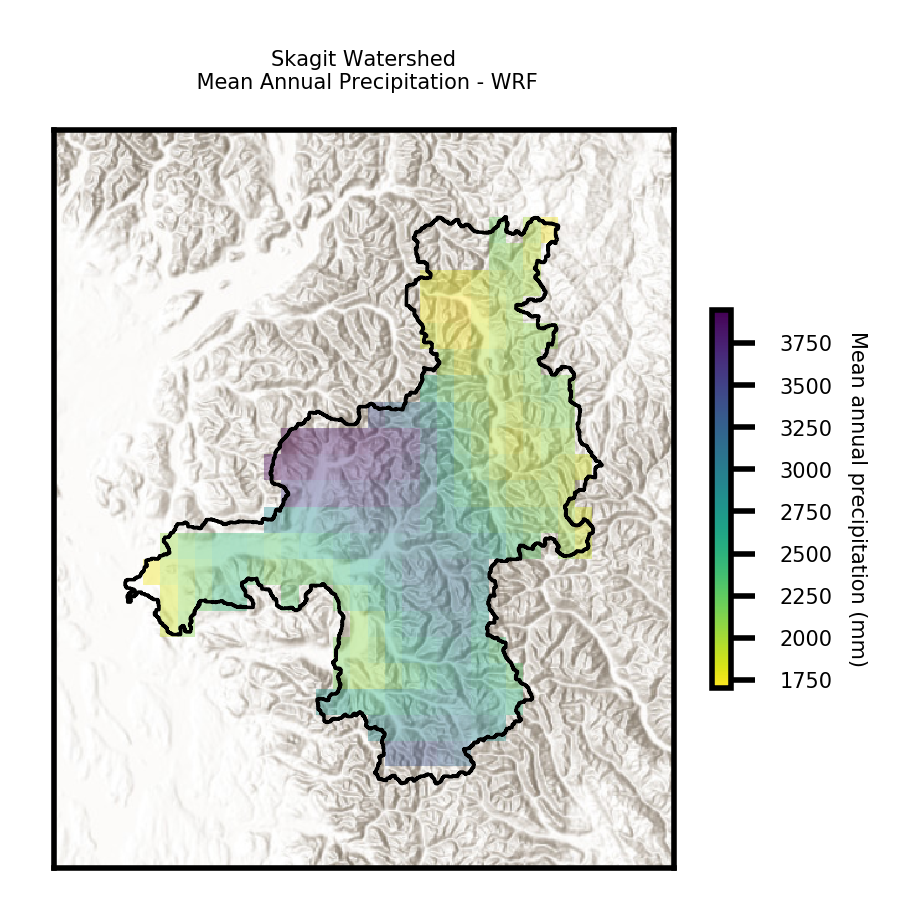

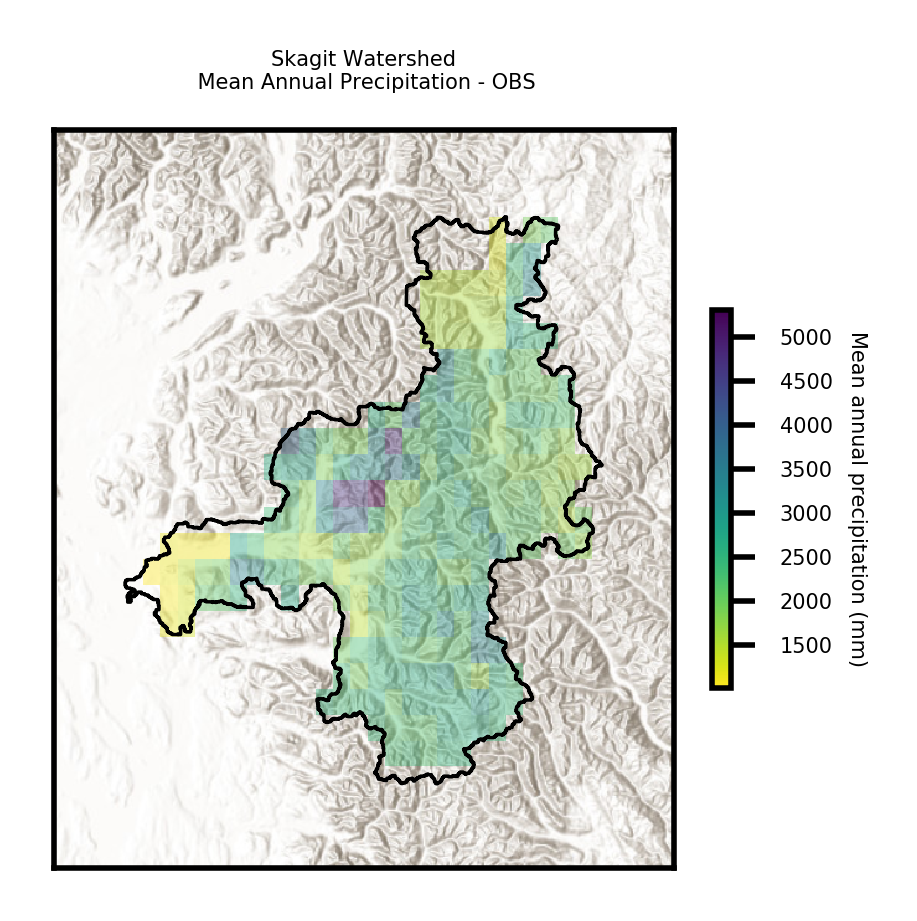

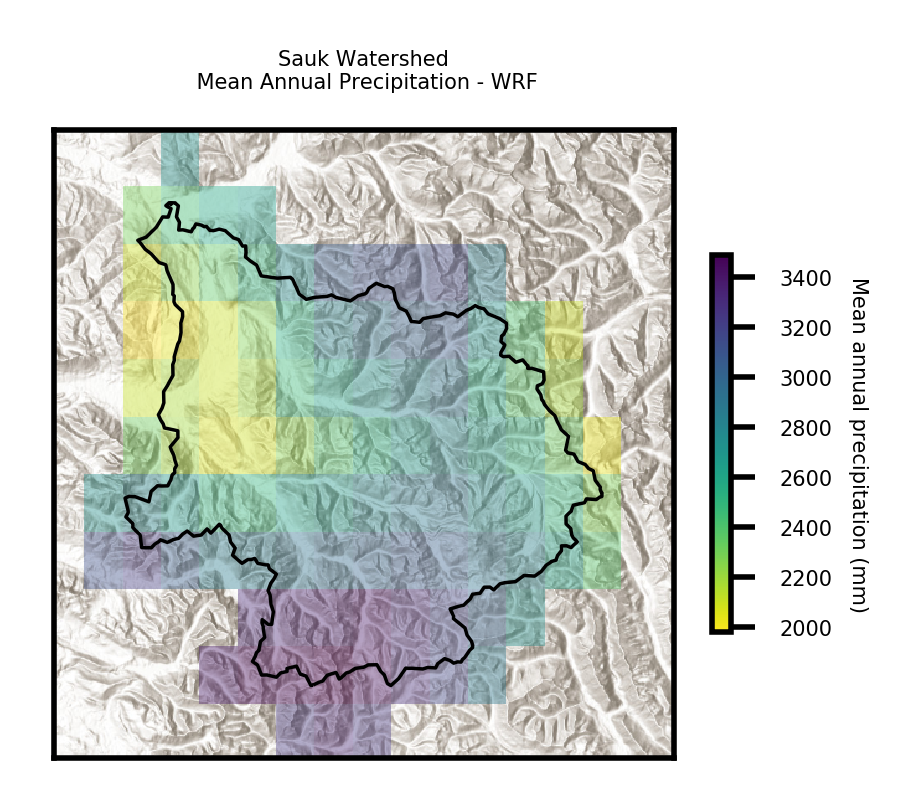

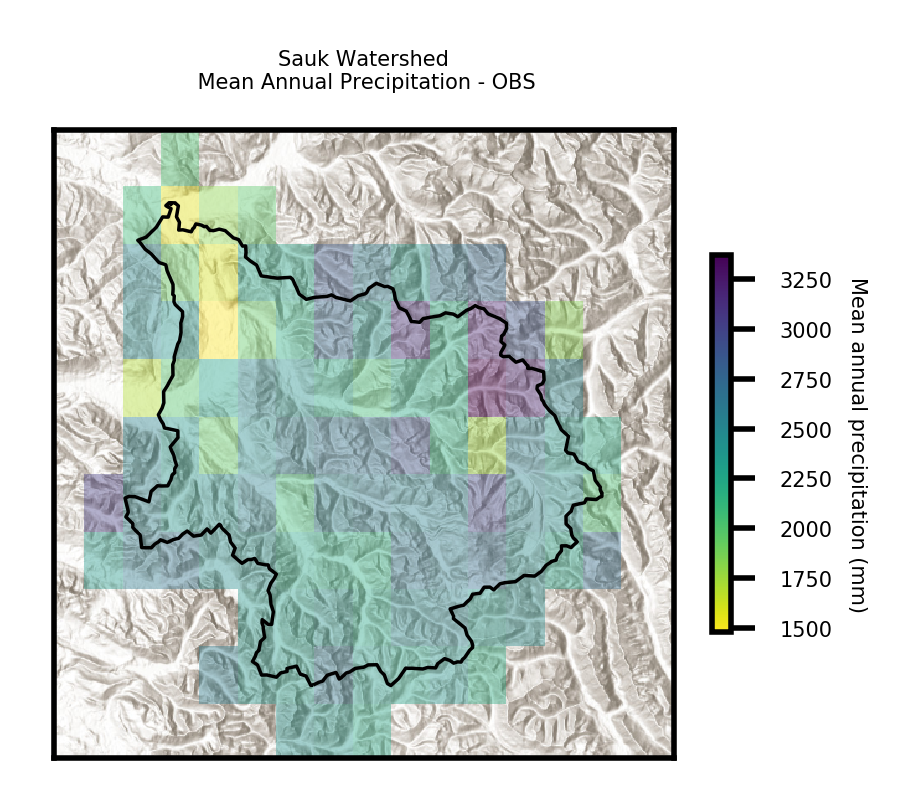

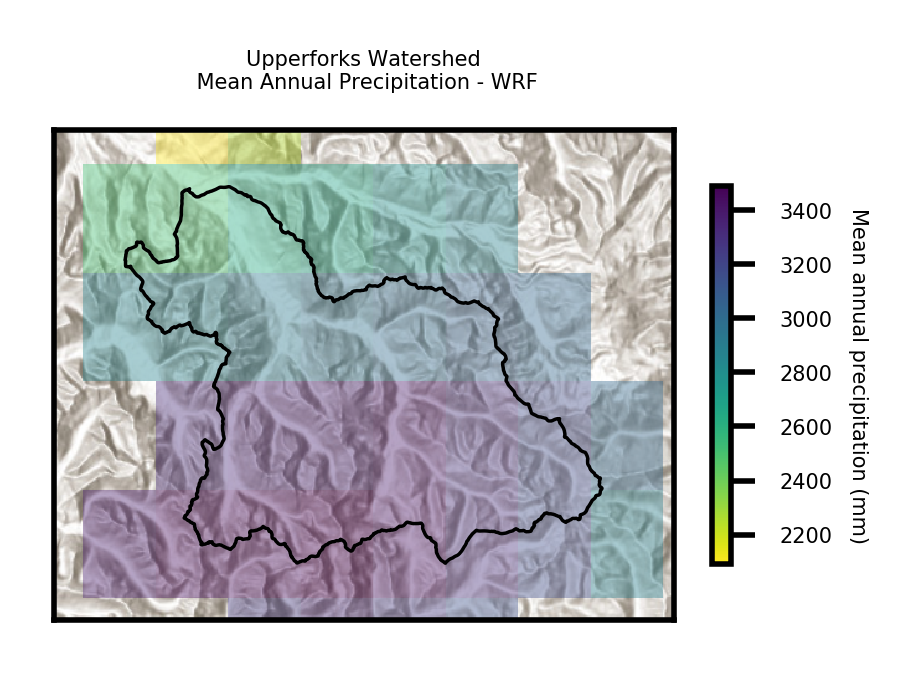

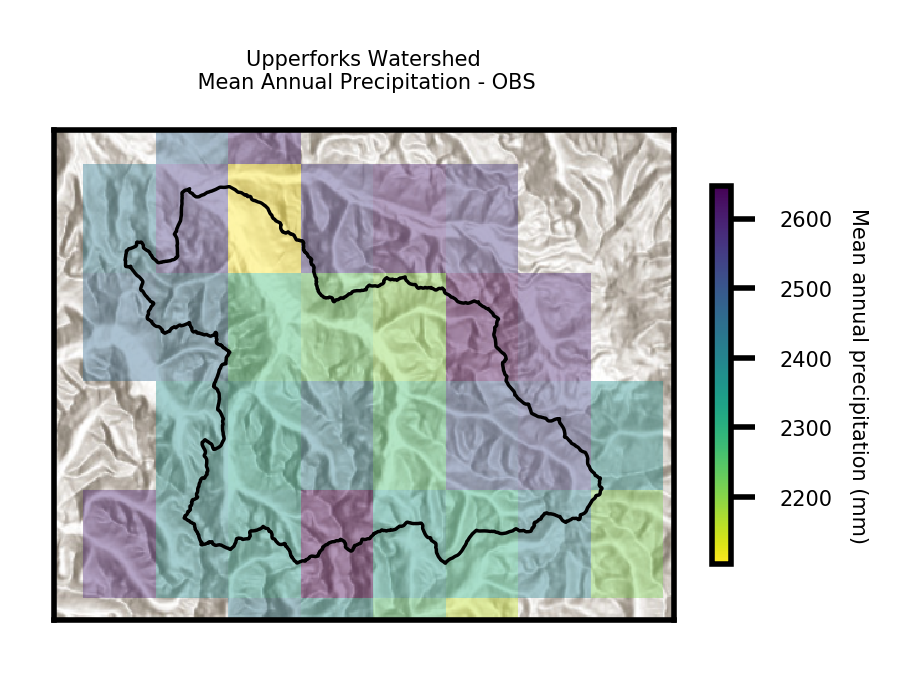

In [51]:
# ts = ltm_skagit['year_PRECIP_dailymet_livneh2013'].mean(axis=0).reset_index().rename(columns={0:'var', 'index':'grid'})
# print(ts)

for eachdict, region, shp in zip([ltm_skagit, ltm_sauk, ltm_upperforks], ['Skagit','Sauk','Upperforks'], [skagit, sauk, upperforks]):
    for eachdf, product in zip(['PRECIP_dailywrf_salathe2014', 'PRECIP_dailymet_livneh2013'], ['WRF', 'OBS']):
        
        # variable time-series
        ts = eachdict[eachdf].groupby(pd.TimeGrouper("Y")).sum().mean(axis=0)
        eachdict['mean_annualsum_'+eachdf] = pd.DataFrame(ts).T
        
        # generate spatial map for mean annual sum P
        renderValuesInPoints(vardf=eachdict['mean_annualsum_'+eachdf],
                             vardf_dateindex=0,
                             shapefile=shp,
                             outfilepath=os.path.join(homedir, '{0}{1}Precip.png'.format(region,product)),
                             plottitle=region+' Watershed'+'\n Mean Annual Precipitation - ' + product,
                             colorbar_label='Mean annual precipitation (mm)',
                             spatial_resolution=1/16, margin=0.15, epsg=3857,
                             basemap_image='Elevation/World_Hillshade',
                             cmap='viridis_r')

In [ ]:
print(ltm_skagit['mean_annualsum_PRECIP_dailymet_livneh2013'].max(axis=1))
print(ltm_skagit['mean_annualsum_PRECIP_dailywrf_salathe2014'].max(axis=1))
print(ltm_sauk['mean_annualsum_PRECIP_dailymet_livneh2013'].max(axis=1))
print(ltm_sauk['mean_annualsum_PRECIP_dailywrf_salathe2014'].max(axis=1))
print(ltm_upperforks['mean_annualsum_PRECIP_dailymet_livneh2013'].max(axis=1))
print(ltm_upperforks['mean_annualsum_PRECIP_dailywrf_salathe2014'].max(axis=1))



In [ ]:
print(ltm_skagit['mean_annualsum_PRECIP_dailymet_livneh2013'].min(axis=1))
print(ltm_skagit['mean_annualsum_PRECIP_dailywrf_salathe2014'].min(axis=1))
print(ltm_sauk['mean_annualsum_PRECIP_dailymet_livneh2013'].min(axis=1))
print(ltm_sauk['mean_annualsum_PRECIP_dailywrf_salathe2014'].min(axis=1))
print(ltm_upperforks['mean_annualsum_PRECIP_dailymet_livneh2013'].min(axis=1))
print(ltm_upperforks['mean_annualsum_PRECIP_dailywrf_salathe2014'].min(axis=1))



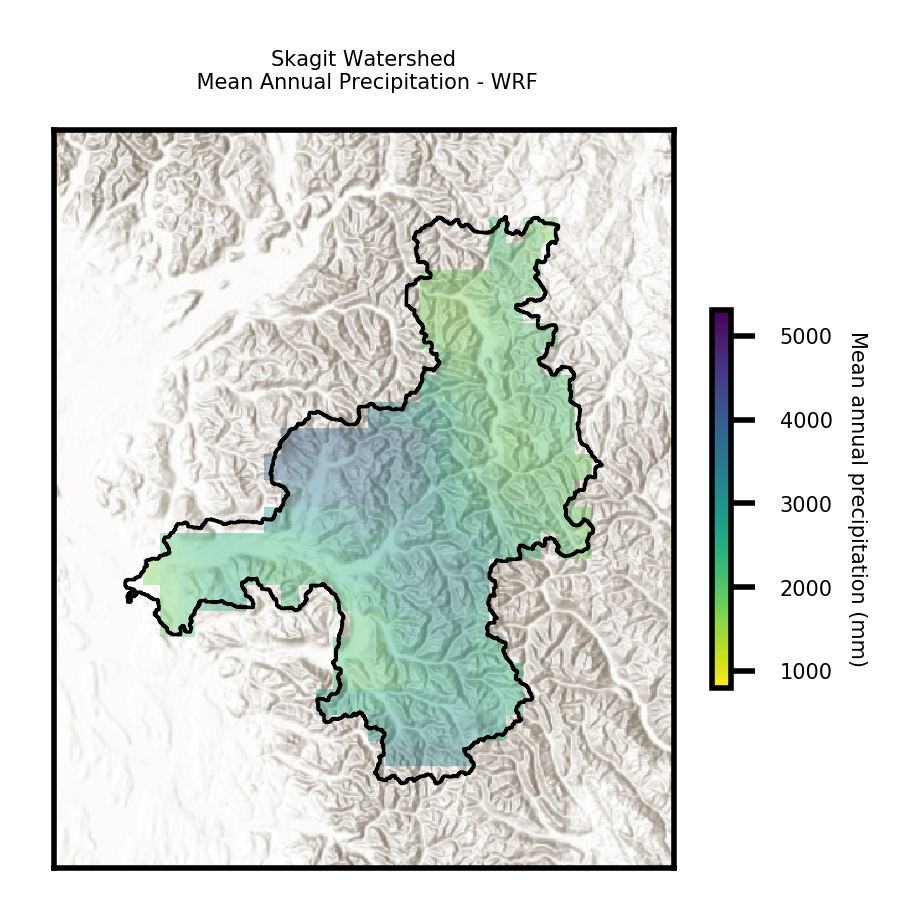

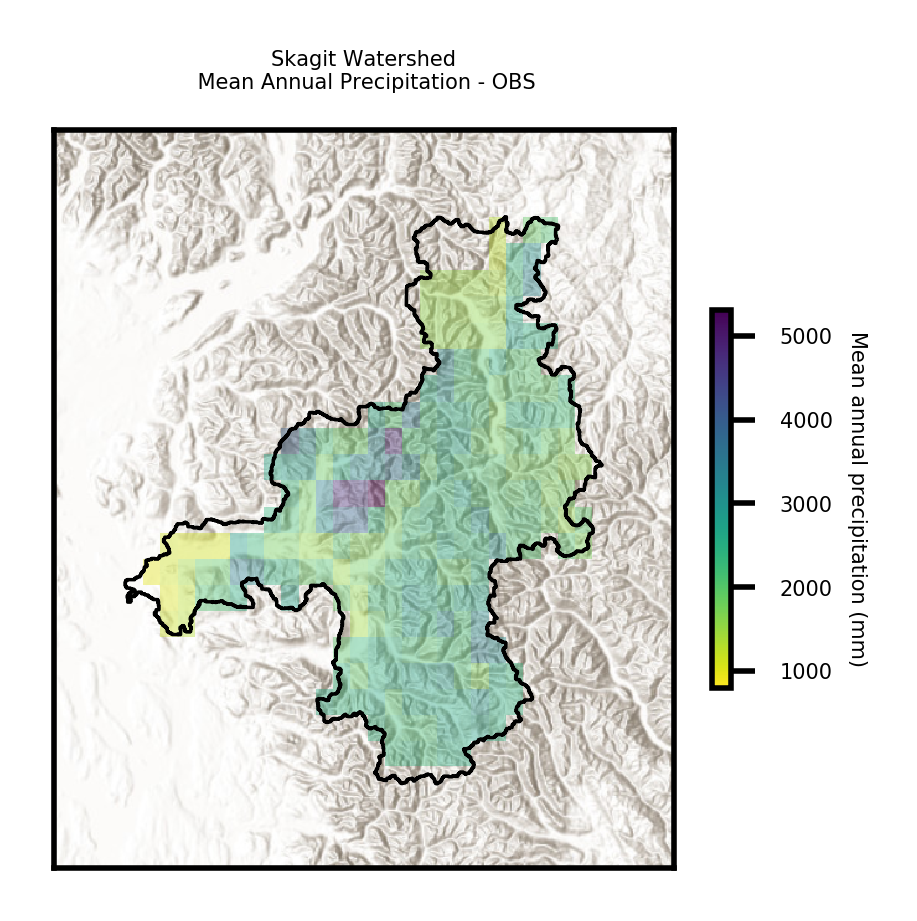

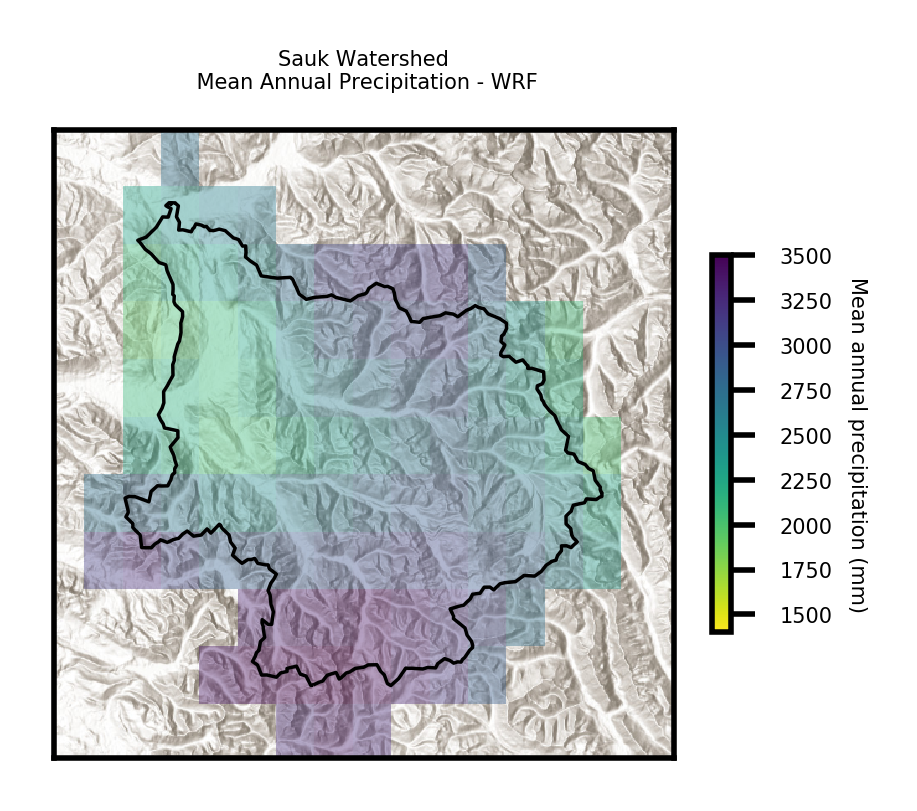

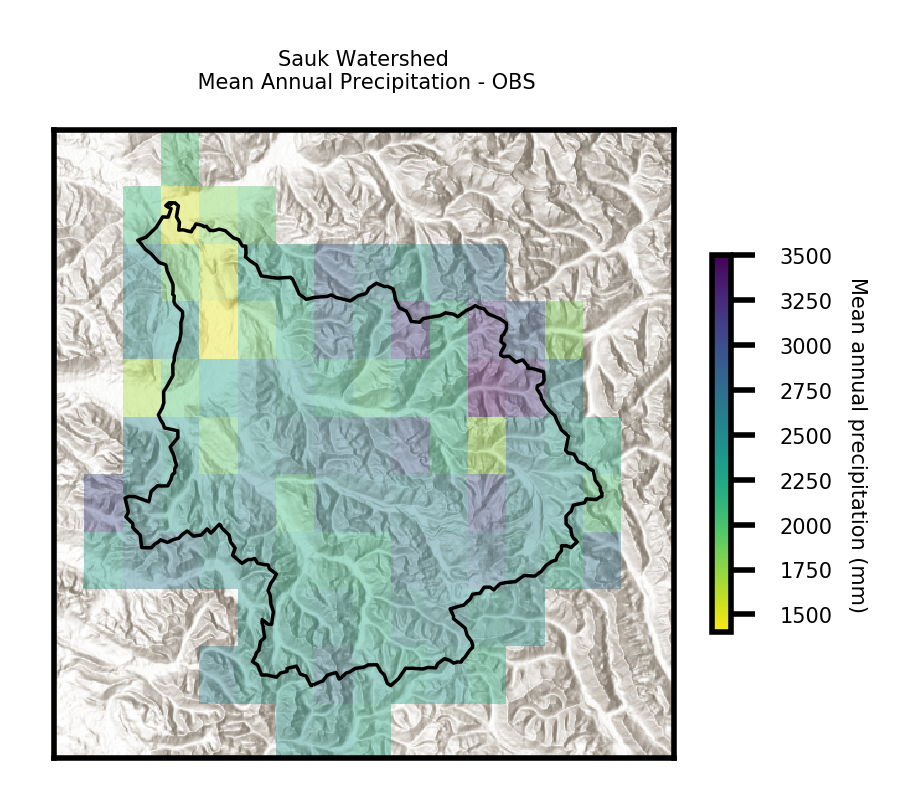

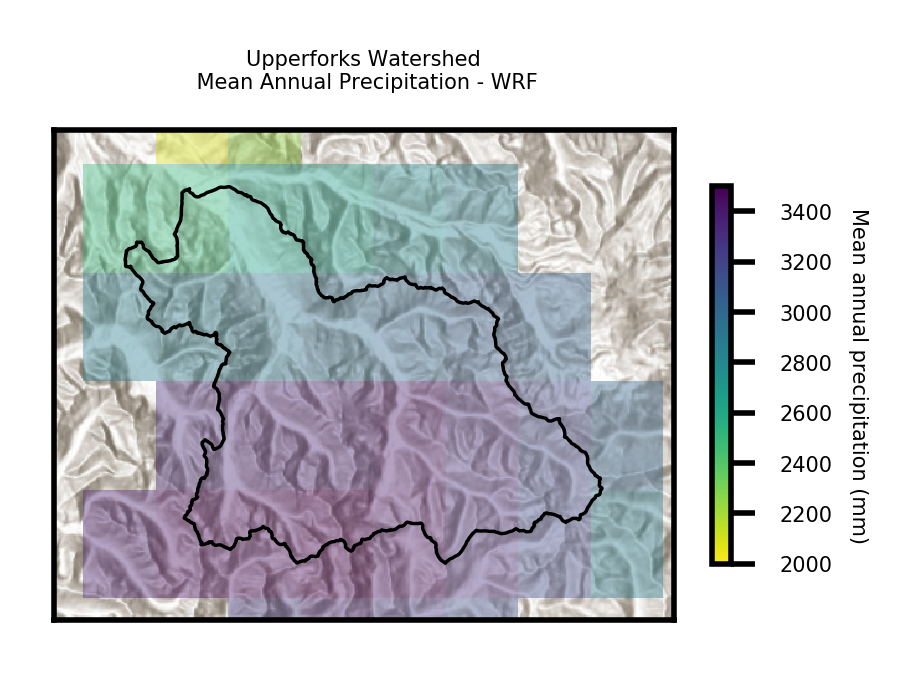

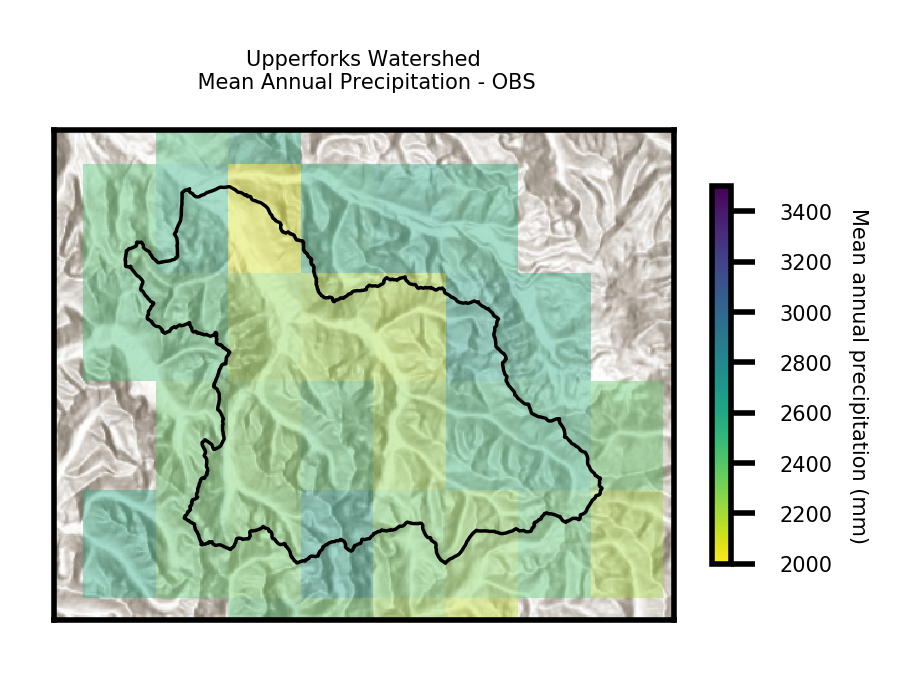

In [53]:
# ts = ltm_skagit['year_PRECIP_dailymet_livneh2013'].mean(axis=0).reset_index().rename(columns={0:'var', 'index':'grid'})
# print(ts)

for eachdict, region, shp, vmin, vmax in zip([ltm_skagit, ltm_sauk, ltm_upperforks],
                                             ['Skagit','Sauk','Upperforks'], 
                                             [skagit, sauk, upperforks],
                                             [800,1400,2000],
                                             [5304,3500,3500]):
    for eachdf, product in zip(['PRECIP_dailywrf_salathe2014', 'PRECIP_dailymet_livneh2013'], ['WRF', 'OBS']):
        
        # variable time-series
        ts = eachdict[eachdf].groupby(pd.TimeGrouper("Y")).sum().mean(axis=0)
        eachdict['mean_annualsum_'+eachdf] = pd.DataFrame(ts).T
        
        # generate spatial map for mean annual sum P
        renderValuesInPoints_scale(vardf=eachdict['mean_annualsum_'+eachdf],
                                   vardf_dateindex=0,
                                   vardfmin=vmin,
                                   vardfmax=vmax,
                                   shapefile=shp,
                                   outfilepath=os.path.join(homedir, '{0}{1}Precip.png'.format(region,product)),
                                   plottitle=region+' Watershed'+'\n Mean Annual Precipitation - ' + product,
                                   colorbar_label='Mean annual precipitation (mm)',
                                   spatial_resolution=1/16, margin=0.15, epsg=3857,
                                   basemap_image='Elevation/World_Hillshade',
                                   cmap='viridis_r')

## Plot Temperature Maps

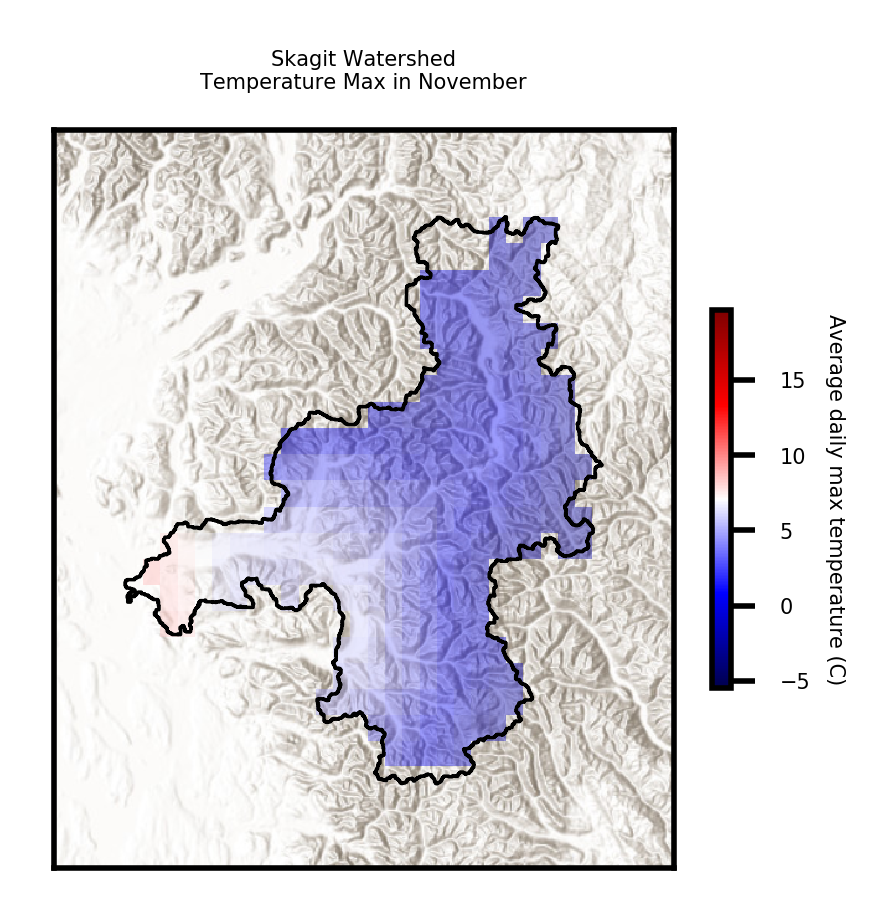

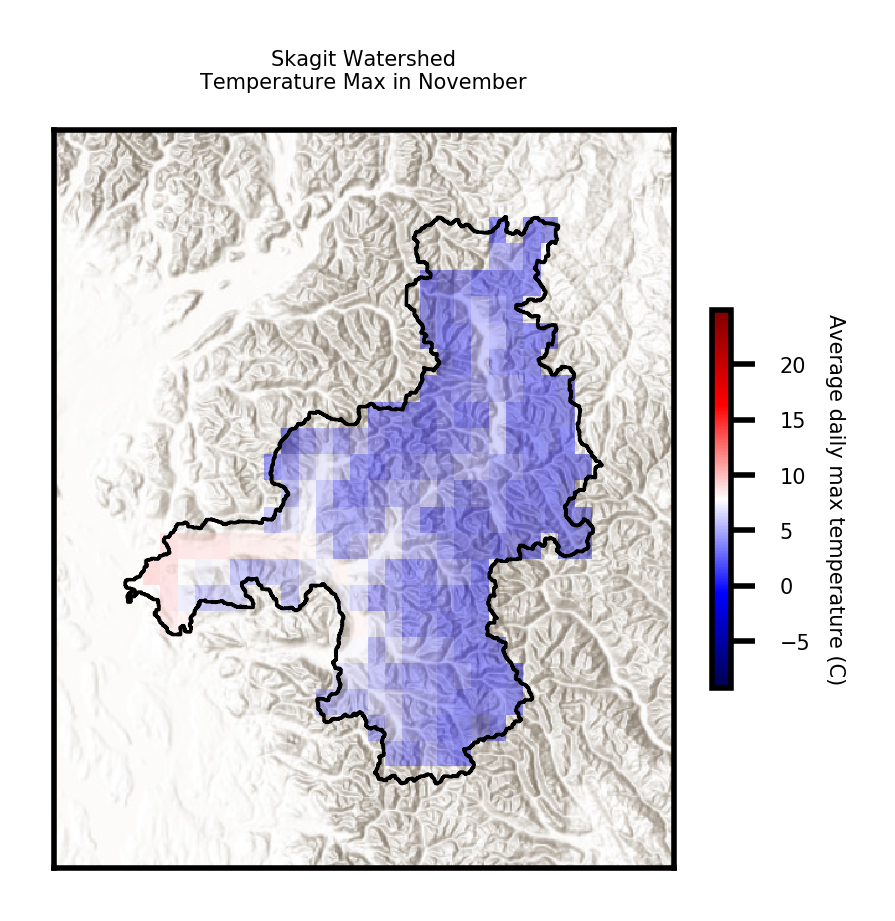

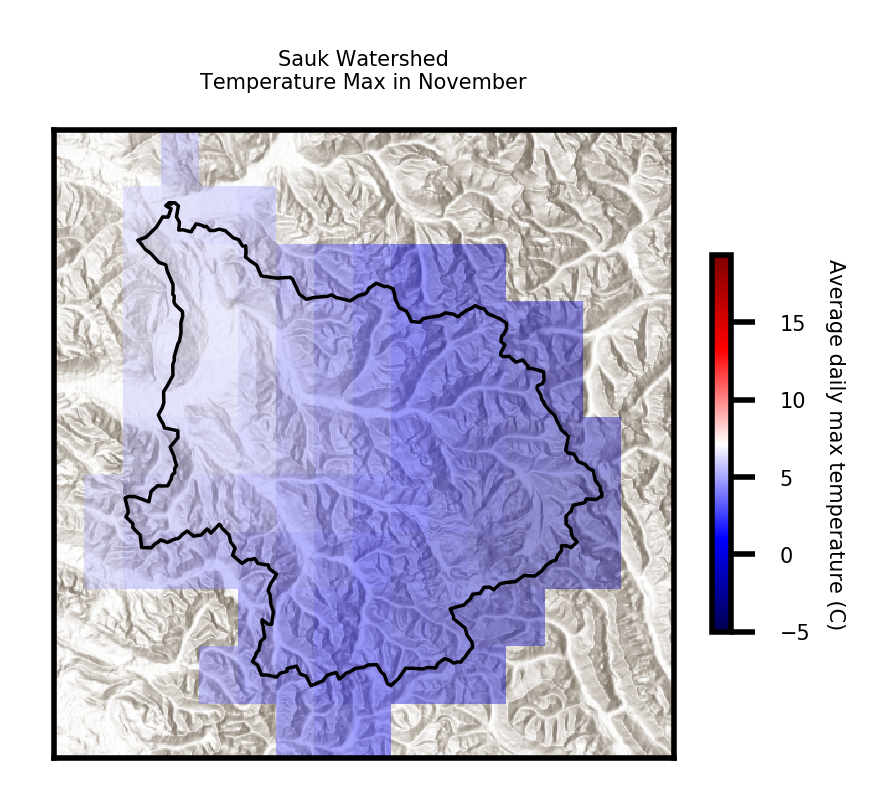

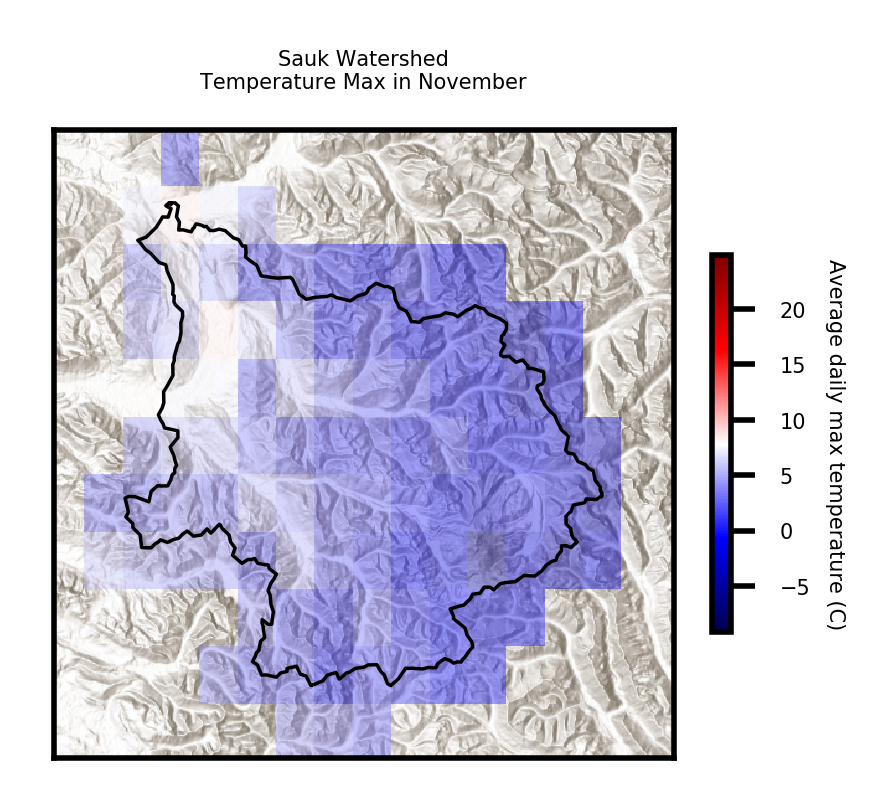

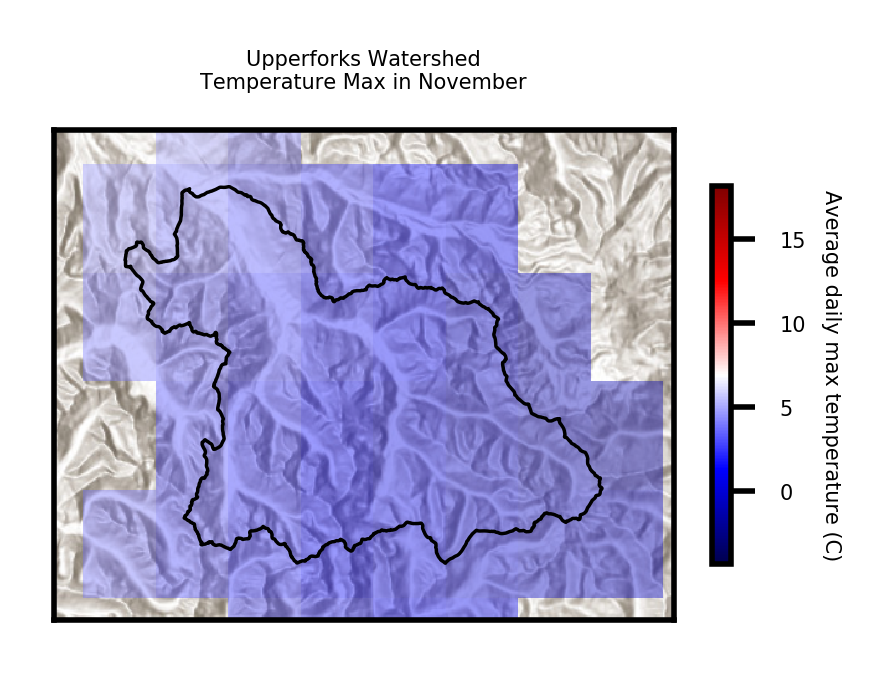

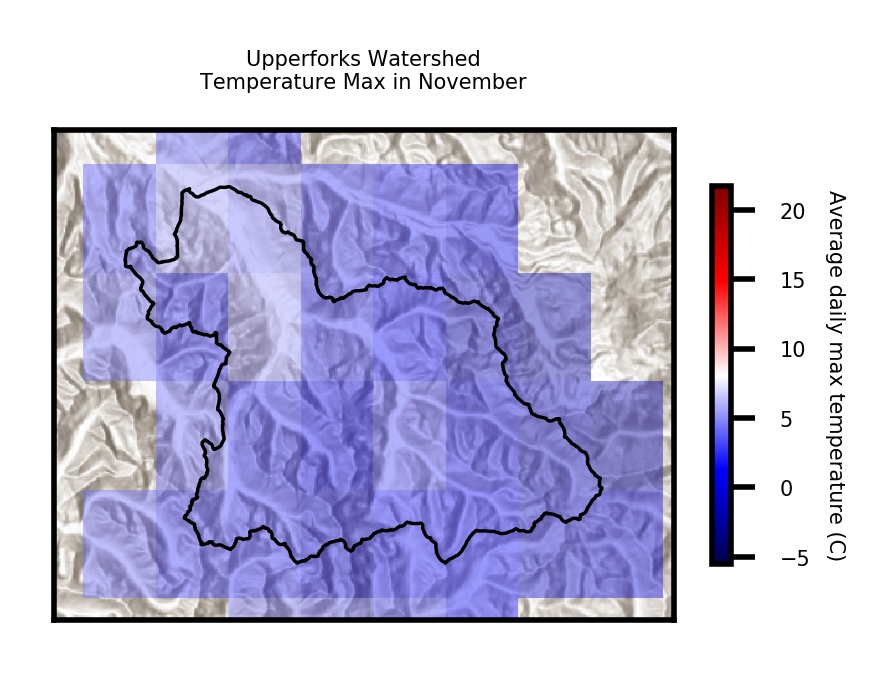

In [56]:
for eachdict, region, shp in zip([ltm_skagit, ltm_sauk, ltm_upperforks], ['Skagit','Sauk','Upperforks'], [skagit, sauk, upperforks]):
    for eachdf, product in zip(['month_TMAX_dailywrf_salathe2014', 'month_TMAX_dailymet_livneh2013'], ['WRF', 'OBS']):
        
        month=11
        monthlabel = pd.datetime.strptime(str(month), '%m')
        renderValuesInPoints(vardf=eachdict[eachdf],
                         vardf_dateindex=month,
                         shapefile=shp,
                         outfilepath=os.path.join(homedir, '{0}{1}TMAX.png'.format(region,product)),
                         plottitle=region+' Watershed'+'\nTemperature Max in '+ monthlabel.strftime('%B')+'-'+product,
                         colorbar_label='Average daily max temperature (C)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic')

In [ ]:
month=11
print(ltm_skagit['month_TMAX_dailymet_livneh2013'].max(axis=1))  #11C
print(ltm_skagit['month_TMAX_dailywrf_salathe2014'].max(axis=1))
print(ltm_sauk['month_TMAX_dailymet_livneh2013'].max(axis=1))  #9C
print(ltm_sauk['month_TMAX_dailywrf_salathe2014'].max(axis=1))
print(ltm_upperforks['month_TMAX_dailymet_livneh2013'].max(axis=1))  #6C
print(ltm_upperforks['month_TMAX_dailywrf_salathe2014'].max(axis=1))



In [ ]:
print(ltm_skagit['month_TMAX_dailymet_livneh2013'].min(axis=1))  #-6C
print(ltm_skagit['month_TMAX_dailywrf_salathe2014'].min(axis=1))
print(ltm_sauk['month_TMAX_dailymet_livneh2013'].min(axis=1)) #-6C
print(ltm_sauk['month_TMAX_dailywrf_salathe2014'].min(axis=1))
print(ltm_upperforks['month_TMAX_dailymet_livneh2013'].min(axis=1)) #-2C
print(ltm_upperforks['month_TMAX_dailywrf_salathe2014'].min(axis=1))



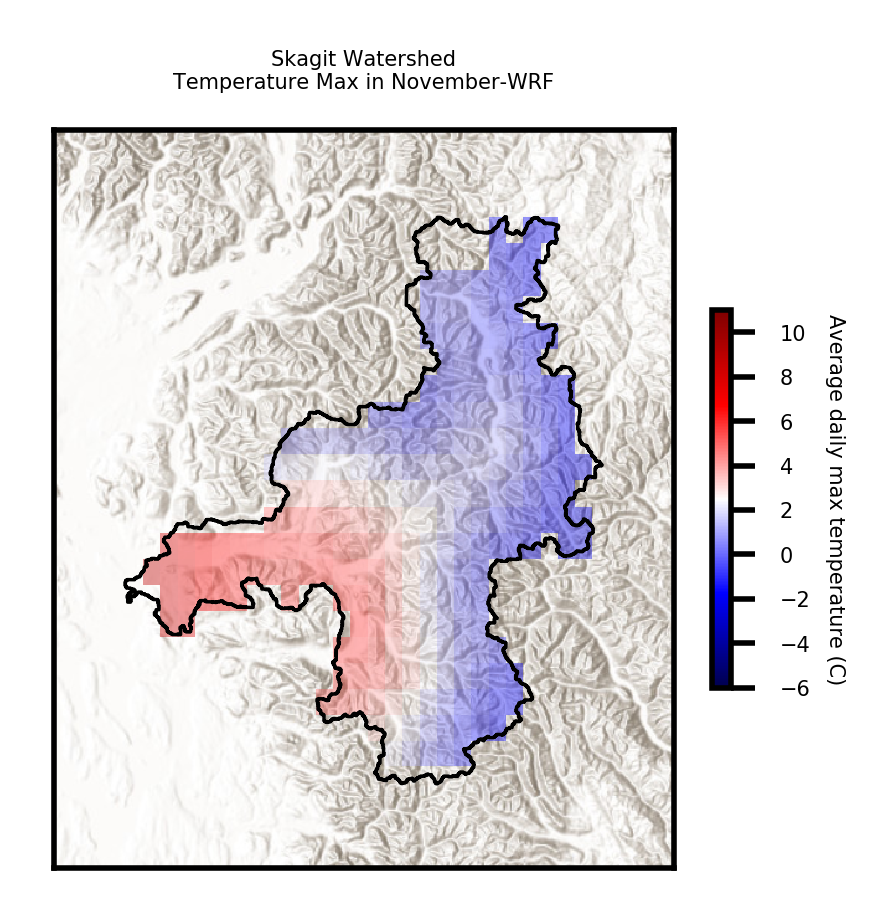

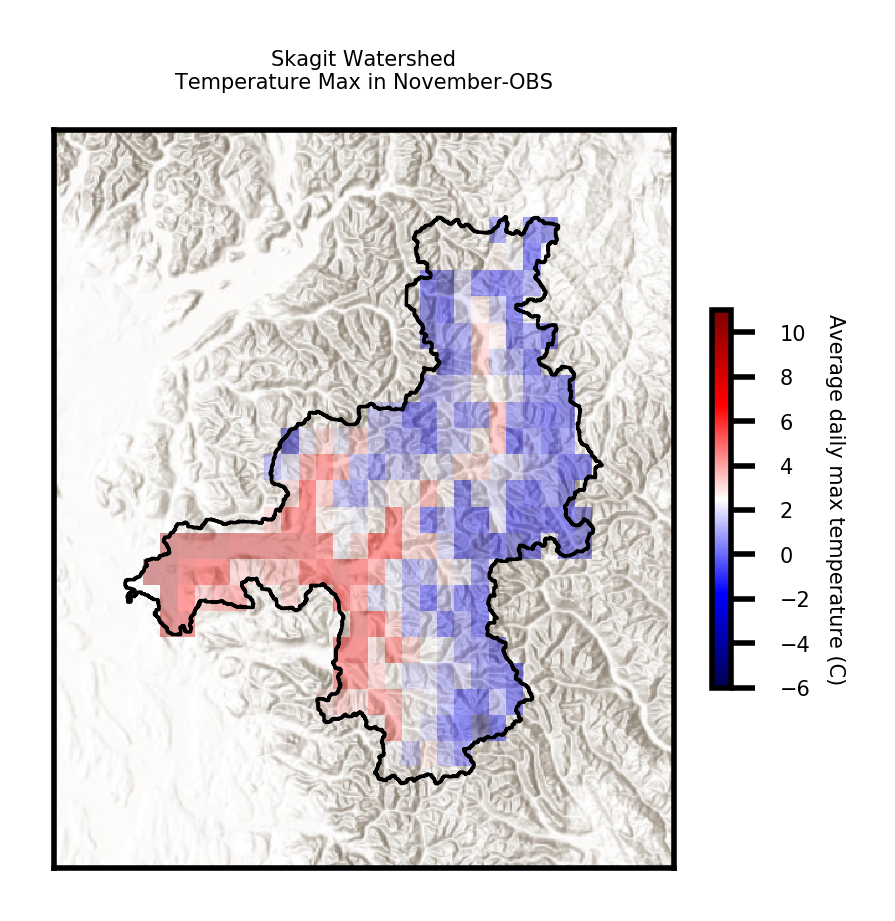

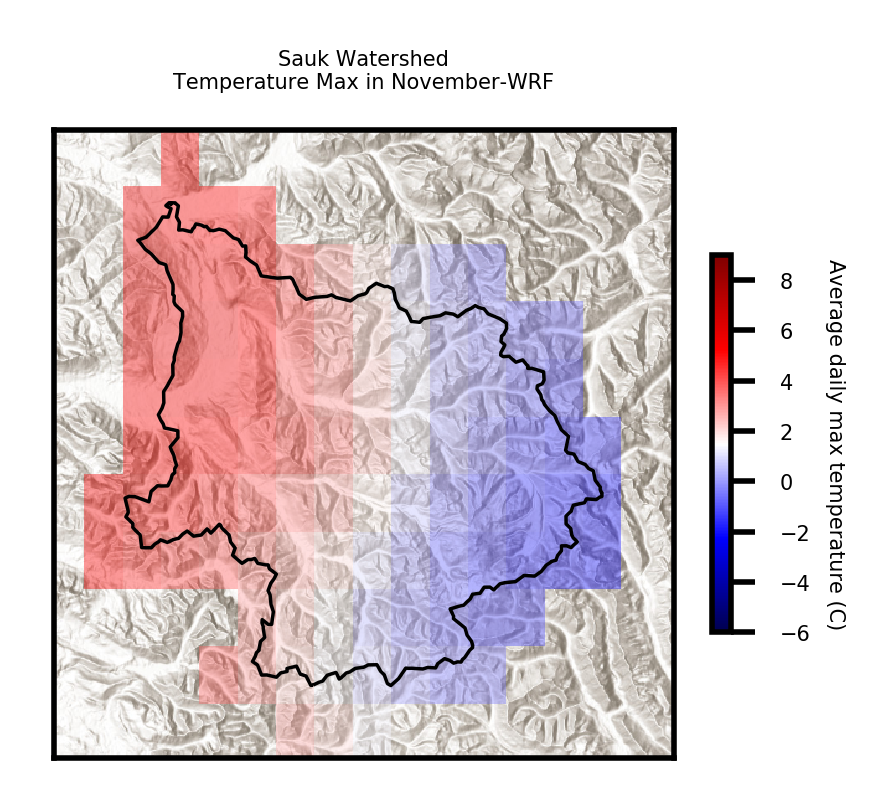

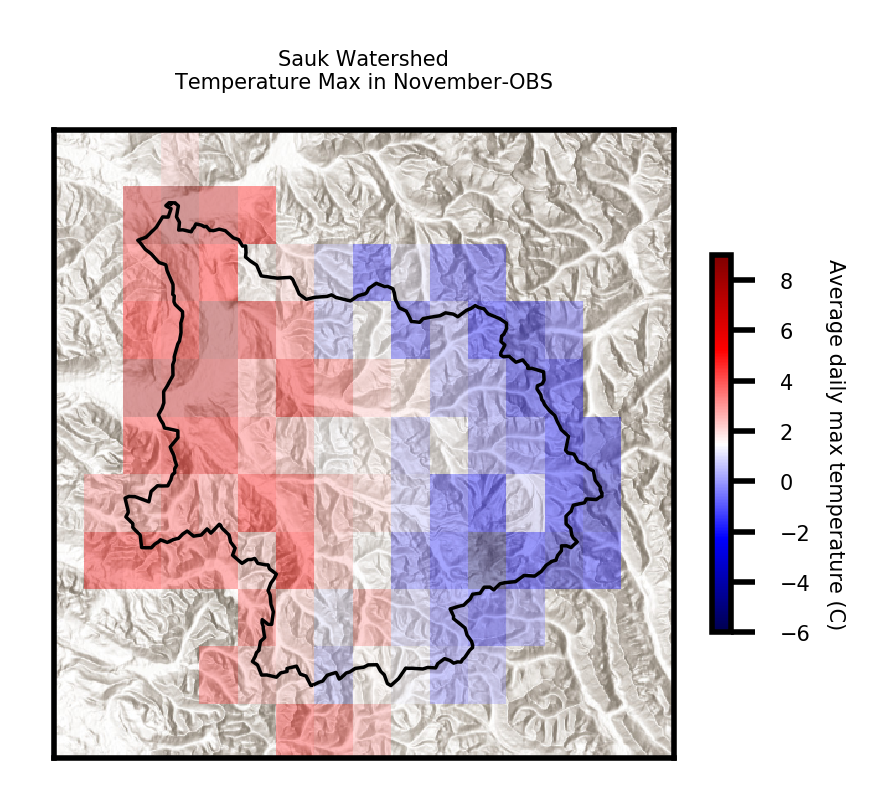

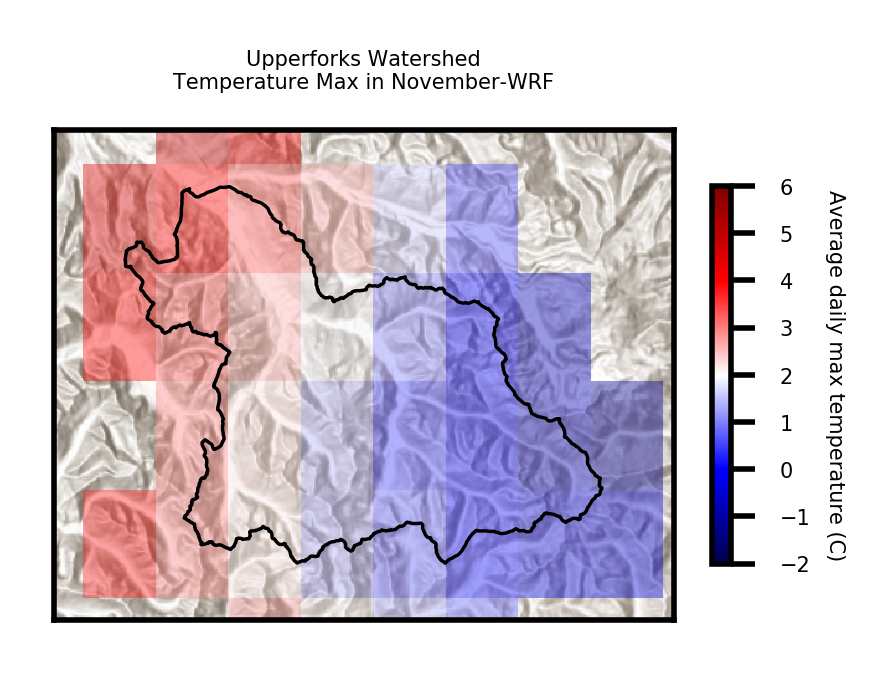

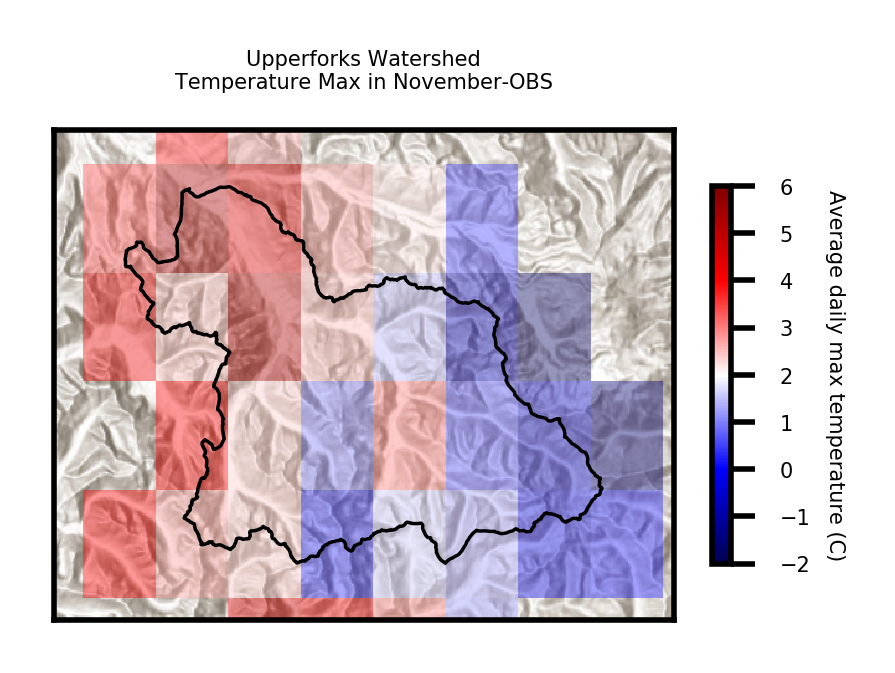

In [86]:
# ts = ltm_skagit['year_PRECIP_dailymet_livneh2013'].mean(axis=0).reset_index().rename(columns={0:'var', 'index':'grid'})
# print(ts)

for eachdict, region, shp, vmin, vmax in zip([ltm_skagit, ltm_sauk, ltm_upperforks],
                                             ['Skagit','Sauk','Upperforks'], 
                                             [skagit, sauk, upperforks],
                                             [-6,-6,-2],
                                             [11,9,6]):
    for eachdf, product in zip(['month_TMAX_dailywrf_salathe2014', 'month_TMAX_dailymet_livneh2013'], ['WRF', 'OBS']):
        
     
        month=11
        monthlabel = pd.datetime.strptime(str(month), '%m')
        renderValuesInPoints_scale(vardf=eachdict[eachdf],
                         vardf_dateindex=month,
                         vardfmin=vmin,
                         vardfmax=vmax,
                         shapefile=shp,
                         outfilepath=os.path.join(homedir, '{0}{1}TMAX.png'.format(region,product)),
                         plottitle=region+' Watershed'+'\nTemperature Max in '+ monthlabel.strftime('%B')+'-'+product,
                         colorbar_label='Average daily max temperature (C)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic')

In [ ]:
%%time

year=2006
yearlabel = pd.datetime.strptime(str(year), '%Y')
renderValuesInPoints(vardf=ltm_skagit['year_PRECIP_dailymet_livneh2013'],
                         vardf_dateindex=year,
                         shapefile=skagit,
                         outfilepath=os.path.join(homedir, 'skagitPrecip{0}.png'.format(yearlabel.strftime('%Y'))),
                         plottitle='Skagit Watershed'+'\nPrecipitation in '+ yearlabel.strftime('%Y'),
                         colorbar_label='Average daily precipitation (mm)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic_r')
year=2006
yearlabel = pd.datetime.strptime(str(year), '%Y')
renderValuesInPoints(vardf=ltm_sauk['year_PRECIP_dailymet_livneh2013'],
                         vardf_dateindex=year,
                         shapefile=sauk,
                         outfilepath=os.path.join(homedir, 'SaukPrecip{0}.png'.format(yearlabel.strftime('%Y'))),
                         plottitle='Skagit Watershed'+'\nPrecipitation in '+ yearlabel.strftime('%Y'),
                         colorbar_label='Average daily precipitation (mm)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic_r')
year=2006
yearlabel = pd.datetime.strptime(str(year), '%Y')
renderValuesInPoints(vardf=ltm_upperforks['year_PRECIP_dailymet_livneh2013'],
                         vardf_dateindex=year,
                         shapefile=upperforks,
                         outfilepath=os.path.join(homedir, 'upperforksPrecip{0}.png'.format(yearlabel.strftime('%Y'))),
                         plottitle='Skagit Watershed'+'\nPrecipitation in '+ yearlabel.strftime('%Y'),
                         colorbar_label='Average daily precipitation (mm)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic_r')

In [ ]:
%%time

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_skagit['month_PRECIP_dailymet_livneh2013'],
                         vardf_dateindex=month,
                         shapefile=skagit,
                         outfilepath=os.path.join(homedir, 'SaukPrecip{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Skagit Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily precipitation (mm)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic_r')

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_sauk['month_PRECIP_dailymet_livneh2013'],
                         vardf_dateindex=month,
                         shapefile=sauk,
                         outfilepath=os.path.join(homedir, 'SaukPrecip{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Sauk-Suiattle Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily precipitation (mm)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic_r')

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_upperforks['month_PRECIP_dailymet_livneh2013'],
                         vardf_dateindex=month,
                         shapefile=upperforks,
                         outfilepath=os.path.join(homedir, 'SaukPrecip{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Upper Sauk Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily precipitation (mm)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic_r')

In [ ]:
%%time

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=scale_df,
                         vardf_dateindex=month,
                         shapefile=skagit,
                         outfilepath=os.path.join(homedir, 'SkagitLivTmax{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Skagit Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily max temperature (C)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic')

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_sauk['month_TMAX_dailymet_livneh2013'],
                         vardf_dateindex=month,
                         shapefile=sauk,
                         outfilepath=os.path.join(homedir, 'SaukLivTmax{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Sauk-Suiattle Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily max temperature (C)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic')

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_upperforks['month_TMAX_dailymet_livneh2013'],
                         vardf_dateindex=month,
                         shapefile=upperforks,
                         outfilepath=os.path.join(homedir, 'UpperforkLivTmax{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Upper Sauk Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily max temperature (C)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic')

In [ ]:
%%time

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_skagit['month_TMAX_dailywrf_salathe2014'],
                         vardf_dateindex=month,
                         shapefile=skagit,
                         outfilepath=os.path.join(homedir, 'SkagitWRFTmax{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Skagit Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily max temperature (C)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic')

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_sauk['month_TMAX_dailywrf_salathe2014'],
                         vardf_dateindex=month,
                         shapefile=sauk,
                         outfilepath=os.path.join(homedir, 'SaukWRFTmax{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Sauk-Suiattle Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily max temperature (C)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic')

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_upperforks['month_TMAX_dailywrf_salathe2014'],
                         vardf_dateindex=month,
                         shapefile=upperforks,
                         outfilepath=os.path.join(homedir, 'UpperforkWRFTmax{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Upper Sauk Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily max temperature (C)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic')

In [ ]:
sorted(ltm_skagit.keys())

In [ ]:
ltm_skagit['PRECIP_dailywrf_salathe2014']

In [ ]:
ltm_sauk['PRECIP_dailywrf_salathe2014'].mean(axis=1).plot()

In [ ]:
for eachdict, region in zip([ltm_skagit, ltm_sauk, ltm_upperforks], ['skagit','sauk','upperforks']):
    for eachdf in ['PRECIP_dailywrf_salathe2014', 'PRECIP_dailymet_livneh2013']:
        
        # variable time-series
        ts = eachdict[eachdf].mean(axis=1).reset_index().rename(columns={0:'var', 'index':'date'})

        # adjust time-series into dataframe
        ts['year'] = ts.date.apply(lambda x: x.year)
        ts['month'] = ts.date.apply(lambda x: x.month)
        ts['day'] = ts.date.apply(lambda x: x.day)
        ts = ts[['year','month','day','var']]

        # output the file
        ts.to_csv(os.path.join(homedir, region+'_'+eachdf+'.txt'), sep='\t', header=False, index=False)
        
        print('DONE: '+ region+'_'+eachdf+'.txt')
        
sorted(os.listdir(homedir))

In [ ]:
%%time

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_skagit['month_PRECIP_dailywrf_salathe2014'],
                         vardf_dateindex=month,
                         shapefile=skagit,
                         outfilepath=os.path.join(homedir, 'SkagitWRFPrecip{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Skagit Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily precipitation (mm)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic_r')

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_sauk['month_PRECIP_dailywrf_salathe2014'],
                         vardf_dateindex=month,
                         shapefile=sauk,
                         outfilepath=os.path.join(homedir, 'SaukWRFPrecip{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Sauk-Suiattle Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily precipitation (mm)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic_r')

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_upperforks['month_PRECIP_dailywrf_salathe2014'],
                         vardf_dateindex=month,
                         shapefile=upperforks,
                         outfilepath=os.path.join(homedir, 'UpperForksWRFPrecip{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Upper Sauk Watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average daily precipitation (mm)',
                         spatial_resolution=1/16, margin=0.15, epsg=3857,
                         basemap_image='Elevation/World_Hillshade',
                         cmap='seismic_r')

In [ ]:
%%time

month=11
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_sauk['month_PRECIP_dailymet_livneh2013'],
                         vardf_dateindex=month,
                         shapefile=sauk.replace('.shp','_2.shp'), 
                         outfilepath=os.path.join(homedir, 'SaukPrecip{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Sauk-Suiattle watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average monthly precipitation (meters)',
                         spatial_resolution=1/16, margin=0.5, epsg=3857,
                         basemap_image='Demographics/USA_Social_Vulnerability_Index',
                         cmap='gray_r')

month=6
monthlabel = pd.datetime.strptime(str(month), '%m')
renderValuesInPoints(vardf=ltm_sauk['month_PRECIP_dailymet_livneh2013'],
                         vardf_dateindex=month,
                         shapefile=sauk.replace('.shp','_2.shp'), 
                         outfilepath=os.path.join(homedir, 'SaukPrecip{0}.png'.format(monthlabel.strftime('%b'))),
                         plottitle='Sauk-Suiattle watershed'+'\nPrecipitation in '+ monthlabel.strftime('%B'),
                         colorbar_label='Average monthly precipitation (meters)',
                         spatial_resolution=1/16, margin=0.5, epsg=3857,
                         basemap_image='ESRI_StreetMap_World_2D',
                         cmap='gray_r')


### Visualize monthly precipitation difference between different gridded data products

In [ ]:
for month in [3, 6, 9, 12]:
    monthlabel = pd.datetime.strptime(str(month), '%m')
    outfile='SaukLivnehPrecip{0}.png'.format(monthlabel.strftime('%b'))
    
    ax1 = renderValuesInPoints(vardf=ltm_sauk['month_PRECIP_dailymet_livneh2013'],
                                   vardf_dateindex=month,
                                   shapefile=sauk.replace('.shp','_2.shp'), 
                                   basemap_image='ESRI_Imagery_World_2D',
                                   cmap='seismic_r',
                                   plottitle='Sauk-Suiattle watershed'+'\nPrecipitation in '+monthlabel.strftime('%B'),
                                   colorbar_label='Average monthly precipitation (meters)',
                                   outfilepath=os.path.join(homedir, outfile))

In [ ]:
%%time
comp = [['meanmonth_TMAX_dailymet_livneh2013','meanmonth_TMAX_dailywrf_salathe2014'],
        ['meanmonth_PRECIP_dailymet_livneh2013','meanmonth_PRECIP_dailywrf_salathe2014']]
wy_numbers=[10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8, 9]
month_strings=[ 'Oct', 'Nov', 'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep']


fig = plt.figure(figsize=(20,5), dpi=500)

ax1 = plt.subplot2grid((2, 2), (0, 0), colspan=1)
ax2 = plt.subplot2grid((2, 2), (1, 0), colspan=1)


# monthly
for eachsumm in df_obj.columns:
    ax1.plot(df_obj[eachsumm])
    

ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=2, fontsize=10)
plt.show()

In [ ]:
df_obj[each].index.apply(lambda x: x+2)

In [ ]:
fig, ax = plt.subplots()
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

lws=[3, 10, 3, 3]
styles=['b--','go-','y--','ro-']

for col, style, lw in zip(comp, styles, lws):
    panel_obj.xs(key=(minElevStation[0][0], minElevStation[0][1], minElevStation[0][2]), axis=2)[col].plot(style=style, lw=lw, ax=ax, legend=True)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=2)
fig.show()
    

    
    
fig, ax = plt.subplots()
lws=[3, 10, 3, 3]
styles=['b--','go-','y--','ro-']

for col, style, lw in zip(comp, styles, lws):
    panel_obj.xs(key=(maxElevStation[0][0], maxElevStation[0][1], maxElevStation[0][2]), 
                 axis=2)[col].plot(style=style, lw=lw, ax=ax, legend=True)

ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=2)
fig.show()

## Set up VIC dictionary (as an example)  to compare to available data

In [ ]:
vic_dr1 = meta_file['dailyvic_livneh2013']['date_range']
vic_dr2 = meta_file['dailyvic_livneh2015']['date_range']
vic_dr = ogh.overlappingDates(tuple([vic_dr1['start'], vic_dr1['end']]),
                              tuple([vic_dr2['start'], vic_dr2['end']]))

vic_ltm_3bands = ogh.gridclim_dict(mappingfile=mappingfile,
                                   metadata=meta_file,
                                   dataset='dailyvic_livneh2013',
                                   file_start_date=vic_dr1['start'], 
                                   file_end_date=vic_dr1['end'],
                                   file_time_step=vic_dr1['time_step'],
                                   subset_start_date=vic_dr[0],
                                   subset_end_date=vic_dr[1])

In [ ]:
sorted(vic_ltm_3bands.keys())

## 10. Save the results back into HydroShare
<a name="creation"></a>

Using the `hs_utils` library, the results of the Geoprocessing steps above can be saved back into HydroShare.  First, define all of the required metadata for resource creation, i.e. *title*, *abstract*, *keywords*, *content files*.  In addition, we must define the type of resource that will be created, in this case *genericresource*.  

***Note:*** Make sure you save the notebook at this point, so that all notebook changes will be saved into the new HydroShare resource.

In [ ]:
#execute this cell to list the content of the directory
!ls -lt

Create list of files to save to HydroShare. Verify location and names.

In [ ]:
!tar -zcf {climate2013_tar} livneh2013
!tar -zcf {climate2015_tar} livneh2015
!tar -zcf {wrf_tar} salathe2014

In [ ]:
ThisNotebook='Observatory_Sauk_TreatGeoSelf.ipynb' #check name for consistency
climate2013_tar = 'livneh2013.tar.gz'
climate2015_tar = 'livneh2015.tar.gz'
wrf_tar = 'salathe2014.tar.gz'
mappingfile = 'Sauk_mappingfile.csv'

files=[ThisNotebook, mappingfile, climate2013_tar, climate2015_tar, wrf_tar]

In [ ]:
# for each file downloaded onto the server folder, move to a new HydroShare Generic Resource
title = 'Results from testing out the TreatGeoSelf utility'
abstract = 'This the output from the TreatGeoSelf utility integration notebook.'
keywords = ['Sauk', 'climate', 'Landlab','hydromet','watershed'] 
rtype = 'genericresource'  

# create the new resource
resource_id = hs.createHydroShareResource(abstract, 
                                          title,
                                          keywords=keywords, 
                                          resource_type=rtype, 
                                          content_files=files, 
                                          public=False)